# Skills analysis for jobs in tech industry

**Names**: 

1. Nursultan Baitlessov
2. Sandip Sonawane

## 1. Introduction and Dataset Research

### 1.1 Motivation

Since the Covid-19 pandemic, 1 out of 5 US worker has considered changing job or fields [1]. In this rapidly changing technology sector, keeping yourself updated with the right skills is important. According to world economic forum, 50% of all employees will need to upskill in order to be relevant in their current position. [2] The LinkedIn career explorer allows users to choose thier current field and their target field and provides the report on how many skills overlap[3]. In this project we will try to answer below questions through our analysis and use of unsupervised learning techniques leant in STAT 430 (Unsupervised Learning) course.

### 1.2 Research Goals
    
1. What are the top skills required for different job categories?
    
2. How different job categories are related to each other and what are the shared skills?
    
3. If someone wants to switch to a different career journey, which one would be easier to switch?
   

### 1.3 References:
    
1. Han N. (2021, Nov. 11). How new learning opportunities are allowing workers to switch careers, 6abc https://6abc.com/career-tips-job-training-software-engineering-changing/11224887/
    
2. Ravin J. (2021, Sept. 14) Future of Work. Fast Company https://www.fastcompany.com/90675619/want-to-future-proof-your-career-prepare-to-invent-yourself
    
3. LinkedIn economic graph. Find new jobs with the skills you already have, LindedIn https://linkedin.github.io/career-explorer/
    
4.  Shashank K., (2019, Aug 19). Evaluate Topic Models: Latent Dirichlet Allocation (LDA)  Medium https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0

### 1.4 Dataset Information

* The dataset has 1222 Facebook job postings information out of which 787 are unique job postings. The textual data is scraped from Faceboook's career page. The links to the actual job posting is also included in one column.

Below is the data dictionary:

> category: job category ('Product Management', 'Research Scientist', 'Data and Analytics',
       'Business Development & Partnerships', 'Software Engineering',
       'People & Recruiting', 'Global Operations')
       
> company: Facebook

> title: 787 unique job titles

> description: Brief description of job and responsibilities.

> basic_qualifications: Basic qualifications required for the job

> preferred_qualifications: Preferred qualifications required for the job

> country: US

> state: ['CA', 'WA', 'TX', 'US', 'NY', 'DC', 'CO', 'PA']

> qualifications: combination of basic qualification and preferred qualifications

## 2. Data Cleaning and Data Manipulation

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn')
from sklearn.manifold import TSNE
import nltk
import re
import seaborn as sns
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS
import warnings
warnings.filterwarnings('ignore')

### 2.1 Reading Input file

In [52]:
df = pd.read_excel('job_data.xlsx')
df_raw = df.copy()
df.head()

,Unnamed: 0,category,company,link,title,location_and_id,posting_date,description,basic_qualifications,preferred_qualifications,country,state,city,job_id,country_name,alpha_2,alpha_3,un_code,qualifications
0,0,Business Intelligence,Amazon,https://www.amazon.jobs/en/jobs/987889/data-en...,Data Engineer II (L5) - Business Data Technolo...,"US, WA, Seattle | Job ID: 987889","Posted November 8, 2019",Amazon’s eCommerce Foundation (eCF) organizati...,"·\n· A desire to work in a collaborative, inte...",·\n· Industry experience as a Data Engineer or...,US,WA,Seattle,987889,United States of America,US,USA,840.0,"·\n· A desire to work in a collaborative, inte..."
1,1,Business Intelligence,Amazon,https://www.amazon.jobs/en/jobs/926586/busines...,Business Intelligence Engineer II,"US, TX, Austin | Job ID: 926586","Posted August 26, 2019",Join Amazon's Employee Resource Center (ERC) t...,· Bachelor's degree in Math/Statistics/Enginee...,"· MBA or Master’s degree in Computer Science, ...",US,TX,Austin,926586,United States of America,US,USA,840.0,· Bachelor's degree in Math/Statistics/Enginee...
2,2,Business Intelligence,Amazon,https://www.amazon.jobs/en/jobs/888114/data-en...,Data Engineering Manager,"US, WA, Seattle | Job ID: 888114","Posted July 1, 2019",The Selling Partner Fees team owns the end-to-...,"· A desire to work in a collaborative, intelle...",· Extensive experience working with AWS with a...,US,WA,Seattle,888114,United States of America,US,USA,840.0,"· A desire to work in a collaborative, intelle..."
3,3,Business Intelligence,Amazon,https://www.amazon.jobs/en/jobs/861498/data-en...,Data Engineer II (L5) - Business Data Technolo...,"US, WA, Seattle | Job ID: 861498","Posted May 20, 2019",Amazon’s eCommerce Foundation (eCF) organizati...,"·\n· A desire to work in a collaborative, inte...",·\n· Industry experience as a Data Engineer or...,US,WA,Seattle,861498,United States of America,US,USA,840.0,"·\n· A desire to work in a collaborative, inte..."
4,4,Business Intelligence,Amazon,https://www.amazon.jobs/en/jobs/1618894/busine...,Business Analyst,"US, WA, Seattle | Job ID: 1618894","Posted July 1, 2021",The BA will use data to support promotion proc...,· Bachelor’s degree in quantitative field\n· 2...,"· Master's degree in Business, Analytics, Engi...",US,WA,Seattle,1618894,United States of America,US,USA,840.0,· Bachelor’s degree in quantitative field\n· 2...


### 2.2 Dropping unnecessary columns

* We will drop the columns that will not be relevant for our analysis

In [53]:
df = df.drop(columns=['Unnamed: 0', 'location_and_id', 'posting_date', 'country_name',
                      'alpha_2', 'alpha_3', 'un_code', 'link', 'city', 'job_id'])
df.head()

,category,company,title,description,basic_qualifications,preferred_qualifications,country,state,qualifications
0,Business Intelligence,Amazon,Data Engineer II (L5) - Business Data Technolo...,Amazon’s eCommerce Foundation (eCF) organizati...,"·\n· A desire to work in a collaborative, inte...",·\n· Industry experience as a Data Engineer or...,US,WA,"·\n· A desire to work in a collaborative, inte..."
1,Business Intelligence,Amazon,Business Intelligence Engineer II,Join Amazon's Employee Resource Center (ERC) t...,· Bachelor's degree in Math/Statistics/Enginee...,"· MBA or Master’s degree in Computer Science, ...",US,TX,· Bachelor's degree in Math/Statistics/Enginee...
2,Business Intelligence,Amazon,Data Engineering Manager,The Selling Partner Fees team owns the end-to-...,"· A desire to work in a collaborative, intelle...",· Extensive experience working with AWS with a...,US,WA,"· A desire to work in a collaborative, intelle..."
3,Business Intelligence,Amazon,Data Engineer II (L5) - Business Data Technolo...,Amazon’s eCommerce Foundation (eCF) organizati...,"·\n· A desire to work in a collaborative, inte...",·\n· Industry experience as a Data Engineer or...,US,WA,"·\n· A desire to work in a collaborative, inte..."
4,Business Intelligence,Amazon,Business Analyst,The BA will use data to support promotion proc...,· Bachelor’s degree in quantitative field\n· 2...,"· Master's degree in Business, Analytics, Engi...",US,WA,· Bachelor’s degree in quantitative field\n· 2...


* We want to primarily analyze the job postings at Facebook, so let's get the Facebook results only

In [54]:
df = df[df.company=='Facebook']
df.head()

,category,company,title,description,basic_qualifications,preferred_qualifications,country,state,qualifications
12443,Product Management,Facebook,Product Manager - Consumer Software (Facebook ...,"Lead the ideation, technical development, and ...",3+ years product management experience or simi...,"Experience developing social products, technol...",US,CA,3+ years product management experience or simi...
12444,Product Management,Facebook,Product Manager - Platform (Facebook Reality L...,"Lead the ideation, technical development, and ...",4+ years product management experience with 2+...,Experience working on a successful developer a...,US,CA,4+ years product management experience with 2+...
12445,Product Management,Facebook,Product Manager,"Display strong leadership, organizational and ...",5+ years product management or related industr...,Experience of going through a full product lif...,US,CA,5+ years product management or related industr...
12446,Product Management,Facebook,Product Management Leader,"Lead a team through the ideation, technical de...",8+ years of experience in Product Management a...,Experience in a consumer focused technology co...,US,CA,8+ years of experience in Product Management a...
12447,Product Management,Facebook,Product Management Lead,"Lead a team through the ideation, technical de...",6+ years of experience in Product Management a...,Experience in a consumer focused technology co...,US,CA,6+ years of experience in Product Management a...


* The number of all Facebook job postings is 1222

In [55]:
df.shape

(1222, 9)

### 2.3 Dropping duplicate job qualifications

- There are some duplicate job qualifications and for the vectorization purposes later, lets drop these duplicates.

In [56]:
df = df.drop_duplicates(subset='qualifications', keep="last")
df = df.reset_index(drop=True)

In [57]:
df.shape

(727, 9)

* Now the number of job postings, which we will analyze, decreased to 727.

In [58]:
df.isna().sum()

category                     0
company                      0
title                        0
description                  0
basic_qualifications         0
preferred_qualifications    77
country                      0
state                        0
qualifications               0
dtype: int64

- Originally, there were 19 columns out of which only 9 are useful. Hence, the other columns are dropped.

- There are no missing values except 77 preferred qualifications. Since these jobs do not have provided preferred qualifications, and we are combining all qualifications in qualifications column, it won't affect our analysis.

### 2.4 Merge description and qualifications columns

* We merge description and qualifications columns to get one column with all of the information provided for every single job opening

In [59]:
df["information"] = df["description"] + df["qualifications"]
df.head()

,category,company,title,description,basic_qualifications,preferred_qualifications,country,state,qualifications,information
0,Product Management,Facebook,Product Manager - Consumer Software (Facebook ...,"Lead the ideation, technical development, and ...",3+ years product management experience or simi...,"Experience developing social products, technol...",US,CA,3+ years product management experience or simi...,"Lead the ideation, technical development, and ..."
1,Product Management,Facebook,Product Manager - Platform (Facebook Reality L...,"Lead the ideation, technical development, and ...",4+ years product management experience with 2+...,Experience working on a successful developer a...,US,CA,4+ years product management experience with 2+...,"Lead the ideation, technical development, and ..."
2,Product Management,Facebook,Product Manager,"Display strong leadership, organizational and ...",5+ years product management or related industr...,Experience of going through a full product lif...,US,CA,5+ years product management or related industr...,"Display strong leadership, organizational and ..."
3,Product Management,Facebook,Product Management Leader,"Lead a team through the ideation, technical de...",8+ years of experience in Product Management a...,Experience in a consumer focused technology co...,US,CA,8+ years of experience in Product Management a...,"Lead a team through the ideation, technical de..."
4,Product Management,Facebook,Product Management Lead,"Lead a team through the ideation, technical de...",6+ years of experience in Product Management a...,Experience in a consumer focused technology co...,US,CA,6+ years of experience in Product Management a...,"Lead a team through the ideation, technical de..."


### 2.5 Data pre-processing for Hierachical Agglomerative Clustering model - Vectorizing the text corpus (TF-IDF vectorization)

* We need to remove stopwords from text, let's use nltk's English stopwords.

In [60]:
stpwords = stopwords.words('english')

In [61]:
new_stopwords = ['age', 'sexual', 'gender', 'disability', 'race', 'religion', 'belief', 'opportunity', 'employer',
                 'discrimate', 'opportunity', 'equal', 'national', 'origin', 'national', 'veteran', 'orientation',
                 'legally', 'problems', 'solutions', 'processing', 'state', 'peer', 'environment', 'proven',
                 'visit', 'https', 'status', 'jobs', 'amazon', 'diverse', 'individual', 'protected', 'discriminate',
                 'disabilities', 'individuals', 'workplace', 'inclusive', 'please', 'us', 'en', 'new', 'committed',
                 'demonstrated', 'minimum', 'current', 'system', 'pattern', 'fundamental',
                 'strong', 'degree', 'year', 'one', 'least', 'identity', 'accommodation', 'years', 'e g', 'ability',
                 'request', 'basis', 'g', 's', 'record', 'experience', 'working', 'etc', 'e', 'knowledge', 'using', 'team',
                 'design', 'bachelor', 'solution', 'field', 'related', 'work', 'hands', 'building', 'relevant',
                 'industry', 'equivalent', 'business', 'problem', 'skill', 'skills', 'application', 'track', 'similar', 'plus',
                 'including', 'professional', 'c c', 'reliability', 'role', 'etl', 'fluid', 'messenger', 'whatsapp',
                 'authorization', 'must', 'obtain', 'employment' 'hire']

for word in new_stopwords:
        stpwords.append(word)

* Below is the function to get the clean tokens from the text, so it:
    * Removes punctuation, characters and numbers from the given text
    * Uses lemmatization to retain the meaning of the words
    * And if the word is not in stopwords, the function will add it the output, which is the list of clean words
    
* This function will be used as a tokenizer later in a TfidfVectorizer function

In [62]:
def tokenization_and_lemmatization(text):
    # Remove punctuation, characters and numbers
    text = re.sub(r"[^a-zA-Z]", " ", text)
    
    # Tokenize text
    tokens = word_tokenize(text)
    
    # We will use lemmatization instead of stemming in order to retain meaning of the words
    lemmatizer = WordNetLemmatizer()

    clean_tokens = []
    for word in tokens:
        clean_tok = lemmatizer.lemmatize(word).lower().strip()

        if clean_tok not in stpwords:
            clean_tokens.append(clean_tok)

    return clean_tokens

* Let's convert the information column to the list structure to fit the TfidfVectorizer to this data

In [63]:
data_information = df.loc[:, 'information'].tolist()
#Example of the first two information entries
data_information[:2]

['Lead the ideation, technical development, and launch of innovative products\nEstablish shared vision across the company by building consensus on priorities leading to product execution\nDrive product development with a team of world-class engineers and designers\nIntegrate usability studies, research and market analysis into product requirements to enhance user satisfaction\nDefine and analyze metrics that inform the success of products\nUnderstand Facebook’s strategic and competitive position and deliver products that are recognized best in the industry\n3+ years product management experience or similar experience\nTechnical experience with analytical tools, methodologies, and design\n3+ years of experience in developing consumer products such as mobile phones, smart home, wearable technologies and platforms, Media products or AR/VR products\nExperience developing social products, technologies and platforms\nExperience delivering products with technology introduction\nBA/BS or equiv

* Let's now convert a collection of raw documents to a matrix of TF-IDF features with the maximum number of words of 1000 and at most 2-gram

In [64]:
tfidf_model_information = TfidfVectorizer(
    max_df=0.99, # max_df : maximum document frequency for the given word
    max_features=1000, # max_features: maximum number of words
    min_df=0.01, # min_df : minimum document frequency for the given word
    use_idf=True, # use_idf: if not true, we only calculate tf
    tokenizer=tokenization_and_lemmatization, # the function that was created earlier
    ngram_range=(1,2) # ngram_range: (min, max), eg. (1, 2) including 1-gram, 2-gram
)

* Fit the TfidfVectorizer to our data and get the document term matrix

In [65]:
# Fit the TfidfVectorizer to our data
tfidf_matrix_information = tfidf_model_information.fit_transform(data_information)
tfidf_matrix_information.shape

(727, 1000)

* Get the list of feature names

In [66]:
# words
tf_selected_words_info = tfidf_model_information.get_feature_names()
tf_selected_words_info[:5]

['able', 'abuse', 'academic', 'access', 'account']

* Convert the document term matrix to a dense ndarray representation of the matrix

In [67]:
# data matrix
tfidf_matrix_np_info = tfidf_matrix_information.toarray()
tfidf_matrix_np_info

array([[0.        , 0.        , 0.        , ..., 0.09244854, 0.1041945 ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.08762705, 0.09876043,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.09642235, 0.10867321,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

Below we can see, after removing stopwords, there are less solid vertical lines. Solid vertical lines in below plot represent words that are repeated in almost all documents.

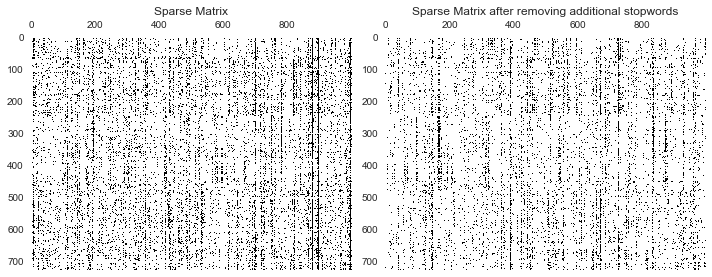

In [23]:
plt.figure(figsize=[10,5])

plt.subplot(121)
plt.spy(tfidf_matrix_np_info_with_stopwords)
plt.title('Sparse Matrix')

plt.subplot(122)
plt.spy(tfidf_matrix_np_info)
plt.title('Sparse Matrix after removing additional stopwords')
plt.tight_layout()
plt.show()

### 2.5 Data pre-processing for LDA model

For the LDA model, we will use count vectorizer since it allows the results to be more interpretable. We will also use gensim to generate bag of words from the count vectorizer in order to match gensim's corpus format requirement. Gensim's corpus format includes a list of tuples of word id and its frequencey.

In [68]:
cv = CountVectorizer(
    max_df=0.99, # max_df : maximum document frequency for the given word
    max_features=1000, # max_features: maximum number of words
    min_df=0.01, # min_df : minimum document frequency for the given word
    tokenizer=tokenization_and_lemmatization,
    ngram_range=(1,2) # ngram_range: (min, max), eg. (1, 2) including 1-gram, 2-gram
)
count_vect_matrix_np_info = cv.fit_transform(data_information)

In [69]:
temp = pd.DataFrame(data=count_vect_matrix_np_info.toarray(), columns=cv.get_feature_names())

In [70]:
temp.head(2)

,able,abuse,academic,access,account,accountability,achieve,achieving,acoustic,across,...,well,wide,wide variety,willingness,within,workflow,workforce,world,world class,writing
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,1,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0


In [71]:
import gensim.corpora as corpora

data_lemmatized = [list(temp.T[temp.T.iloc[:, i]>0].index) for i in temp.T.columns]
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

## 3. Basic Descriptive Analytics

### 3.1 Visualizing distribution of pre-assigned class labels

* We plot the distribution of pre-assigned class labels as a histogram below

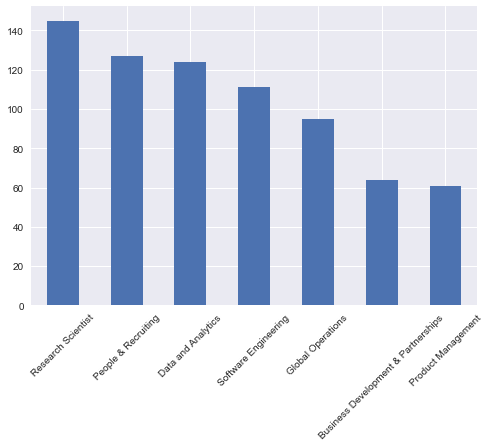

In [72]:
df.category.value_counts().plot(kind='bar')
plt.xticks(rotation=45)
plt.show()

* From this histogram we can see that the most job postings in Facebook were for Research Scientist position (about 145 job postings) and the least job postings were for Product Management position (about 60 job postings)

In [73]:
pd.DataFrame(tfidf_matrix_np_info, columns=tf_selected_words_info).describe()

,able,abuse,academic,access,account,accountability,achieve,achieving,acoustic,across,...,well,wide,wide variety,willingness,within,workflow,workforce,world,world class,writing
count,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,...,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000,727.000000
mean,0.003210,0.003566,0.004113,0.002914,0.003991,0.003342,0.006395,0.003105,0.003615,0.032800,...,0.010877,0.007636,0.003361,0.003316,0.015122,0.008454,0.006089,0.008301,0.005967,0.004286
std,0.018818,0.028834,0.028511,0.018028,0.022071,0.018124,0.026145,0.017978,0.035380,0.039642,...,0.027743,0.028294,0.019526,0.018599,0.029886,0.036157,0.037467,0.027041,0.023142,0.020920
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026211,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.054102,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,0.162119,0.378535,0.514395,0.178323,0.276463,0.166089,0.186116,0.202675,0.563874,0.200995,...,0.181367,0.230297,0.266122,0.148663,0.187659,0.394803,0.423547,0.300522,0.135346,0.215324


### 3.2 Visualizing word cloud for all job categories

* Create the function to plot word cloud for different positions

In [74]:
categories = df.category.unique()
categories

array(['Product Management', 'Research Scientist', 'Data and Analytics',
       'Business Development & Partnerships', 'Software Engineering',
       'People & Recruiting', 'Global Operations'], dtype=object)

In [75]:
def plot_wordcloud(text):
    corpus = " ".join(text)
    # plot wordcloud
    stopwords = set(STOPWORDS)
    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    stopwords = stpwords,
                    min_font_size = 10).generate(corpus)
    return wordcloud

* Plot word cloud for different positions

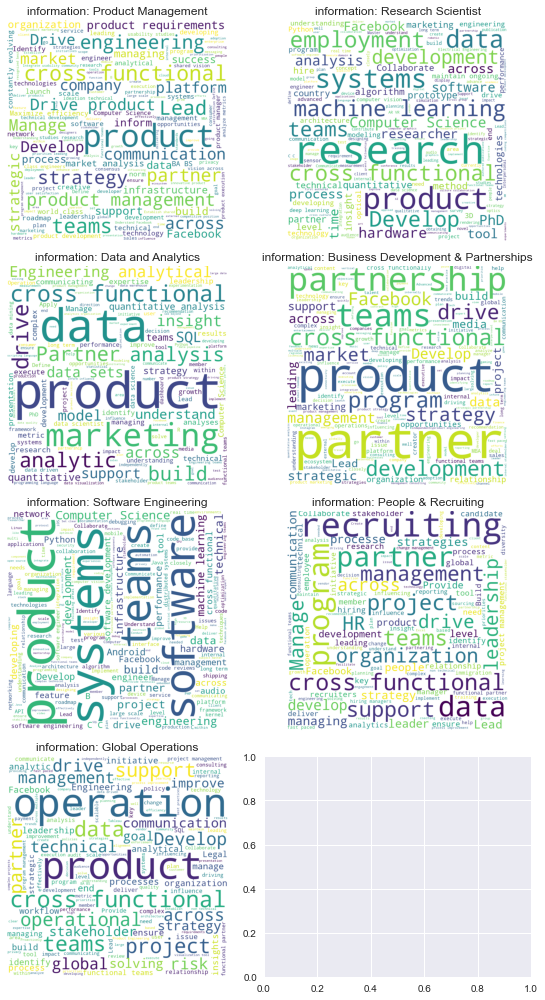

In [76]:
num_row = 4
num_col = 2

# get a segment of the dataset
num = num_row*num_col

# plot images
fig, axes = plt.subplots(num_row, num_col, figsize=(4*num_col,3.5*num_row))

for i in range(num_row* num_col):
    if i == 7:
        continue
    try:
        wordcloud = plot_wordcloud(df.information[df.category==categories[i]])
        ax = axes[i//num_col, i%num_col]
        ax.imshow(wordcloud)
        ax.axis("off")
        ax.set_title(f'information: {categories[i]}')
    except:
        pass

plt.tight_layout()
plt.show()

## 4. Dataset Scaling Decisions

Since we have used tf-idf vectorizer to convert raw text into vectorized form, all of the values in all of the columns have a range between 0 and 1. Also for count vectorizer, if we perform scaling, it results in loss of interpretability. Hence we do not need to perform scaling.

## 5. Clusterability and Clustering Structure Questions

### 5.1 t-SNE Plot with pre-assigned Category type Labels

* Below are the plots for t-SNE scatterplots for our document term matrix using three different perplexity values and random states. The points are color-coded by the pre-assigned category type labels.

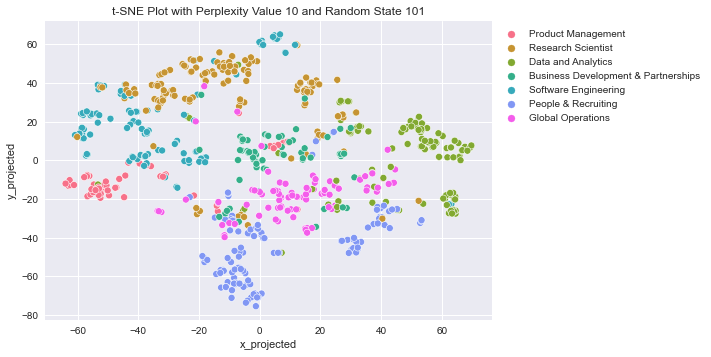

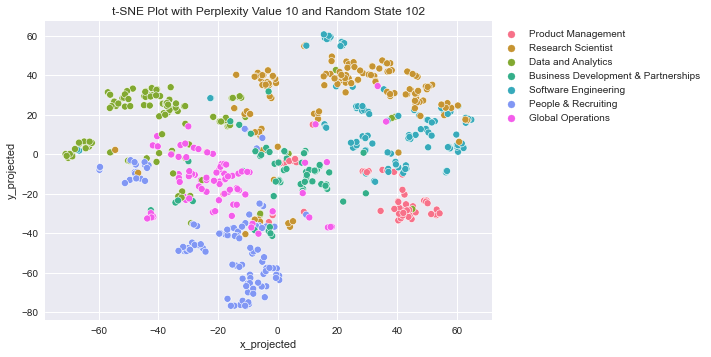

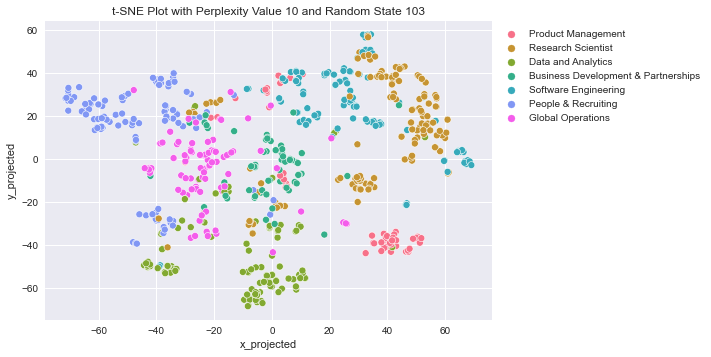

--------------------------------------------


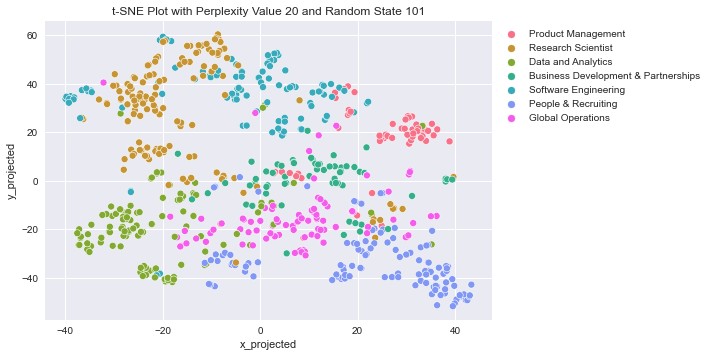

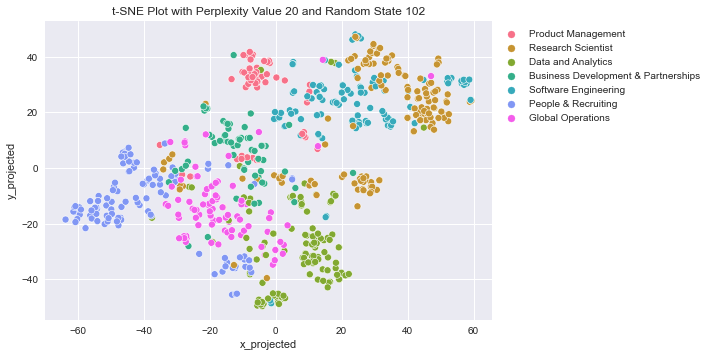

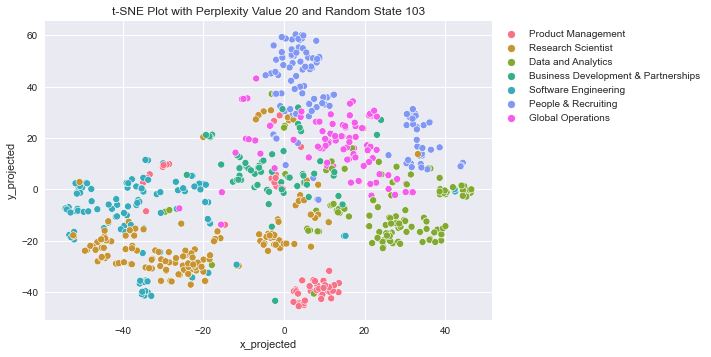

--------------------------------------------


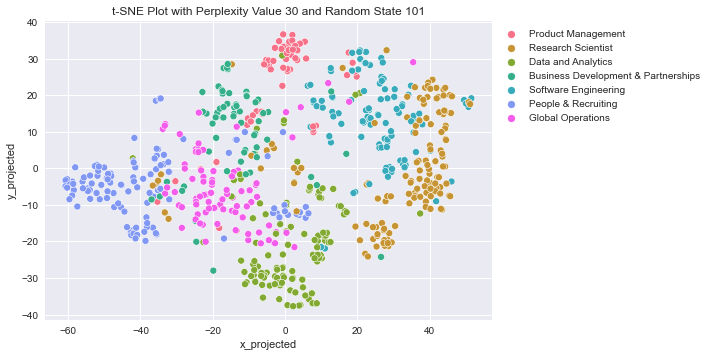

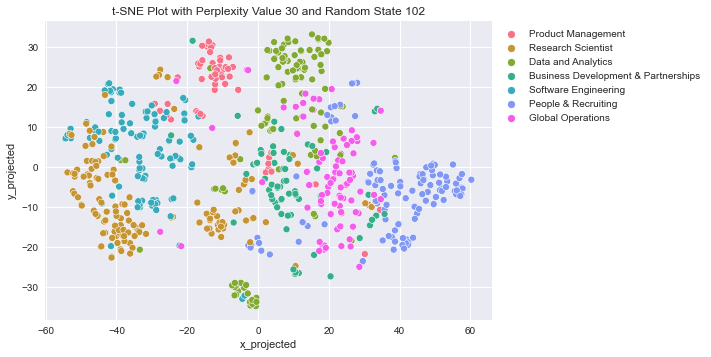

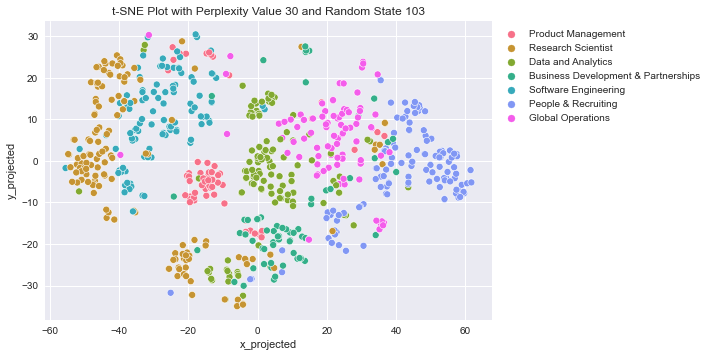

--------------------------------------------


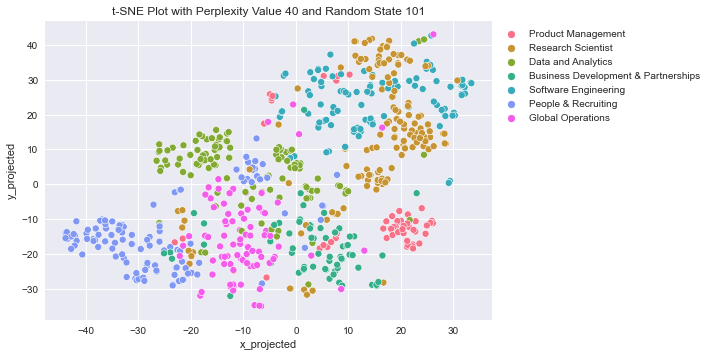

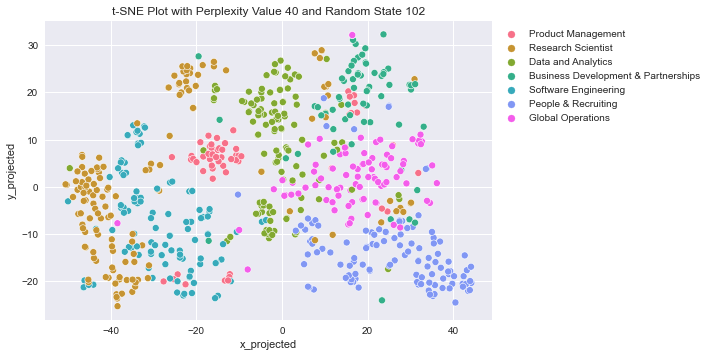

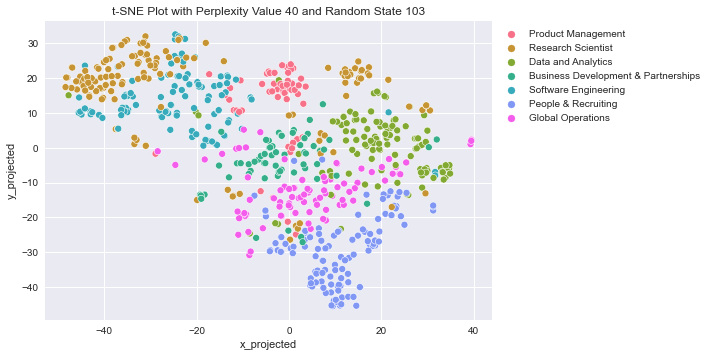

--------------------------------------------


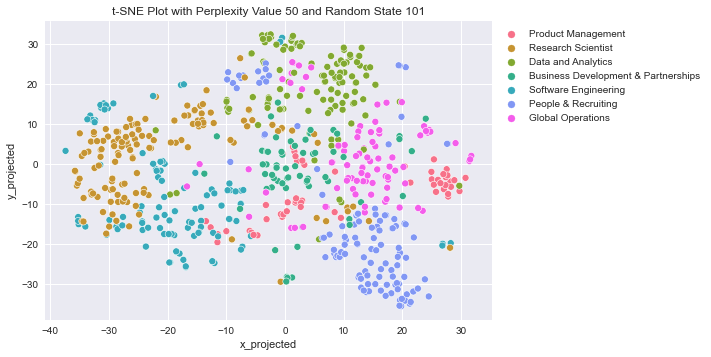

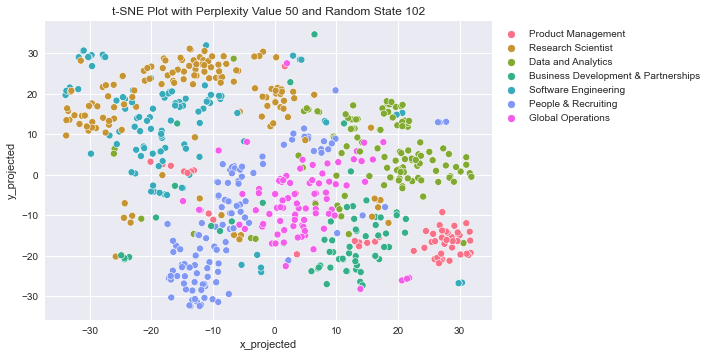

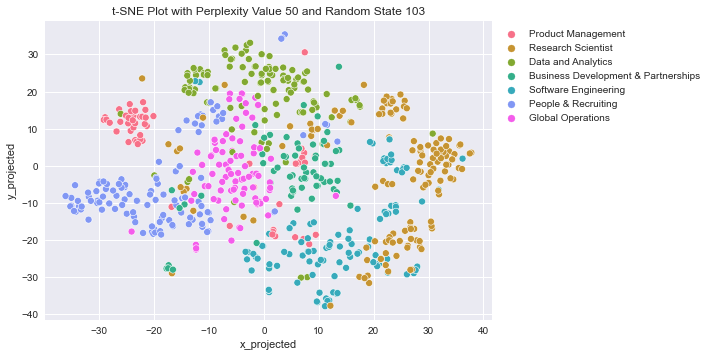

--------------------------------------------


In [27]:
for perp in [10, 20, 30, 40, 50]:
    for rs in [101,102,103]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(tfidf_matrix_np_info)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', hue='category', palette=sns.color_palette("husl", 7), data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.legend(bbox_to_anchor=(1,1))
        plt.show()
    print('--------------------------------------------')

### 5.2 T-SNE plot that provides the best representation of the clustering structure

* All of the t-SNE plots provide pretty much the same clustering structure. We believe that the t-SNE plot with perplexity value of 20 and a random state of 103 provides the best representation of the clustering structure

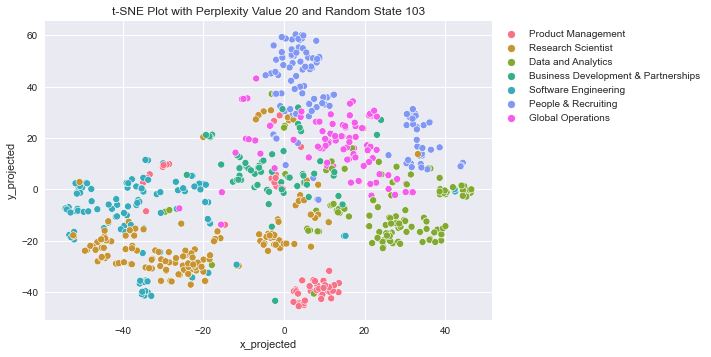

In [28]:
perp = 20
rs = 103
tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
data_tsne = tsne.fit_transform(tfidf_matrix_np_info)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
sns.scatterplot(x='x_projected',y='y_projected', hue='category', palette=sns.color_palette("husl", 7), data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

### 5.3 Analysis suggests that the dataset is clusterable

* By looking at the t-SNE plots above, we can clearly see the underlying clustering structure with at least 4 main clusters. For example, if we look at the t-SNE plot with perplexity value of 20 and random state of 103, we can see these clusters as the following:
    * 1) The cluster containing mostly Product Management job openings below
    * 2) The cluster containing mostly People & Recruting job openings at the top
    * 3) Big cluster on the left of the plot
    * 4) Another big cluster on the right of the plot

### 5.4 Describe the Underlying Clustering Structure of the Dataset

* a) As was mentioned in the previous section, the data has at least 4 main clusters. However, in fact, there could be more clusters, as according to the t-SNE plot, the presence of sub-clusters in the main clusters is evident. We could say that if we count all of the sub-clusters, in total there could be about 9 sub-clusters.
* b) The shape of the underlying 4 main clusters and potential 9 sub-clusters is ellipsoidal.
* c) If we look at the main 4 clusters, then they are not balanced in size, because the clusters at the bottom and at the top are smaller than the clusters at the left and at the right. However, if we look at the sub-clusters, we can say that all of them are almost balanced in size.
* d) If we look at the main 4 clusters, they do not overlap much with each other. However, we are interested in the sub-clusters' structure as well, and we can see that the sub-clusters overlap a lot with each other.

## 6. Algorithm Selection Motivation

- Based on t-SNE plot, we can see that for the same job category, there are small clusters at different proximity. Hence, this suggests that a hierarchical clustering algorithm may be able to identify such levels. Also, this algorithm will help us to answer our research questions, such as how different job categories are related to each other and what are the shared skills between the similar categories.

- Also, we want to understand which are the dominant words in each of the job category to understand the top skills that are required. This suggests that using Latent Dirichlet Algorithms (LDA) can be a good option.

## 7. Clustering Algorithm 1 (Hierarchical Agglomerative Clustering)



### 7.1. Parameter Selection

#### 7.1.1 Qualitative analysis on choosing the HAC linkage

* The most crucial parameters for this algorithm are the type of the HAC linkage and the number of anticipated clusters in the data. We will not focus on the number of anticipated clusters, as we are using HAC algorithm and we are interested in seeing the nested relationship of clusters for different number of clusters. What about the HAC linkage parameter, there are four types of linkages, which are single, average, complete and Ward's linkage. We need to choose which linkage will work the best for our given data. In this analysis, we will refer to clusters as all of the clusters including main clusters and sub-clusters

* Based on our data, **the HAC with complete linkage** may be **the best**, because:
    * Even if it splits the main clusters apart, it is still able to identify the main clusters
    * It tends to work better with overlapping clusters
    * It is robust to noise that we have in our data

* Based on our data, we can claim that the **HAC with Ward's linkage** may be the second best, as it is good at identifying the spherical clusters, but it may not be the ideal clustering algorithm, because:
    * The clusters are not well-separated
    * The data has some noise

* Based on our data, we can claim that the **HAC with single linkage** may not be the ideal clustering algorithm, because:
    * The clusters are not well-separated, so with hierachical agglomerative clustering with single linkage these two clusters will merge into one cluster
    * There is evidence of having the sub-clusters, which means that these sub-clusters may not merge into one main cluster with single linkage technique but each of the sub-clusters could be the separate clusters by themselves

* Since we have a higher preference for a complete linkage than for a signle linkage, we believe that **HAC with average linkage** will not be the best in clustering, as it provides results between single and complete linkage

#### 7.1.2 Clustering Algorithm Selection - Using Average Silhouette Score

* Let's start from plotting the average Silhouette scores for HAC model with different types of linkages. Each of the average silhouette score plots plot the average silhouette score for clusterings with k=2, k=3, ..., k=14 clusters, respectively.

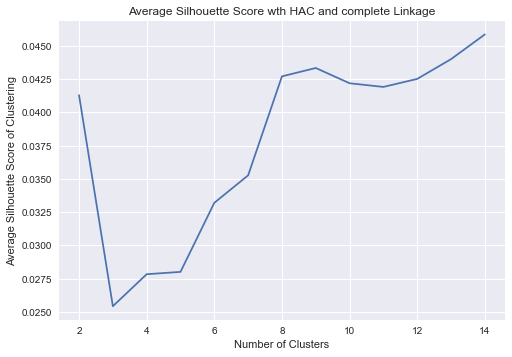

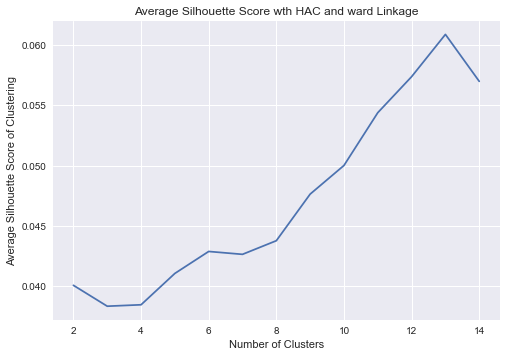

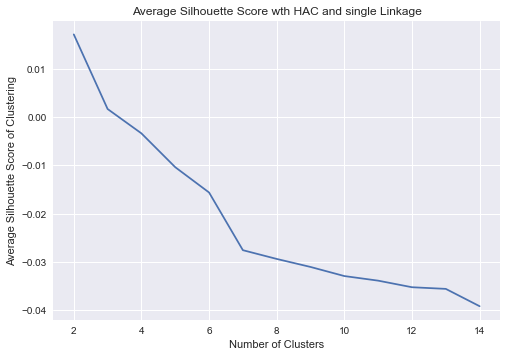

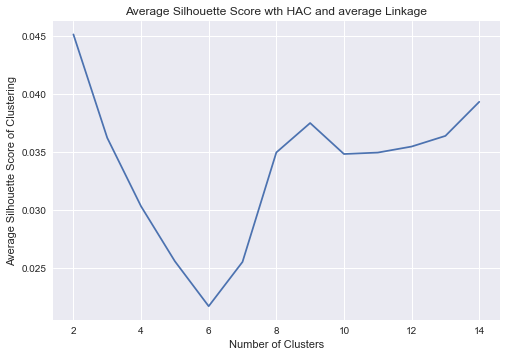

In [29]:
for link in ['complete', 'ward', 'single', 'average']:
    avg_ss=[]
    for k in [2,3,4,5,6,7,8,9,10,11,12,13,14]:
        #First, designate the HAC linkage function, and the number of clusters you want to extract from the resulting dendrogram
        hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage=link)
        Y_pred = hac.fit_predict(tfidf_matrix_np_info)
        avg_ss.append(silhouette_score(tfidf_matrix_np_info, Y_pred))
        
    plt.plot([2,3,4,5,6,7,8,9,10,11,12,13,14], avg_ss)
    plt.title('Average Silhouette Score wth HAC and %s Linkage'%link)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Average Silhouette Score of Clustering')
    plt.show()

* It looks like the clustering and cluster number that produced the highest average silhouette score (which means best cohesion and separation) above is a **HAC with Ward's linkage with k=13 clusters**. However, this may not be the best number of clusters, as we might get one of the clusters to have only noise in it. Thus it may make sense to also examine lower values of k or examine complete linkage which is more robust to the separation of the clusters and noise.
* The highest Silhoette score for **HAC with single linkage** is with k=2 clusters, which may not be the number of clusters and it makes sense to examine other algorithm

* Since, the Ward's linkage provides too many clusters for the best Silhouette score and also the Silhoette scores are close to zero, which means that the clusters are overlapping a lot. It makes sense to choose the HAC with complete linkage, as it is more robust to overlapping clusters and provides an interesting Silhoette plot, where after k=9 the Silhouette score drops and increases again later. That is why, we will go with the **HAC with complete linkage with k=9**, as this number of clusters has the highest cohesion and separation.

#### 7.1.3 Clustering Algorithm Selection - Combining Results

* The results for both the qualitative analysis and using average Silhouette plots agree and we choose the **HAC with complete linkage** as our clustering algorithm.

### 7.2. Clustering Algorithm - Hierarchical Agglomerative Clustering with Complete Linkage

* Since there is no single value that we have chosen for HAC complete linkage, we will create dendogram and plot t-SNE plots and choose the value k in section 7.3

#### 7.2.1 Dendrogram

* We create the dendogram below using hierarchical agglomerative clustering with complete linkage

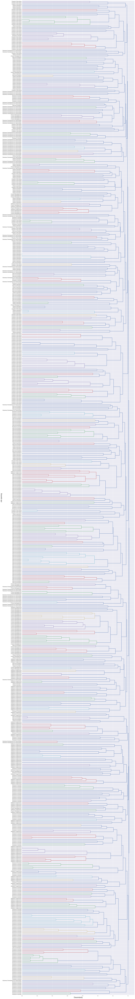

In [30]:
dm = pdist(tfidf_matrix_np_info, metric='euclidean')
Z = linkage(dm, method='complete')

fig, ax = plt.subplots(figsize=(22, 200))
d = dendrogram(Z, orientation='right', labels=df['category'].array, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Job opening', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

#### 7.2.2 t-SNE Individual Clustering Visualization

* For each of the clusterings with k=2,k=3,...,k=14 clusters, we color code the points in our selected t-SNE plot with the respective cluster labels. And we also define the shape of the points by the job category.

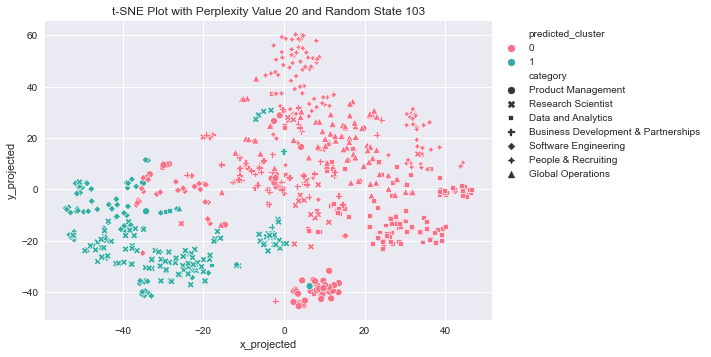

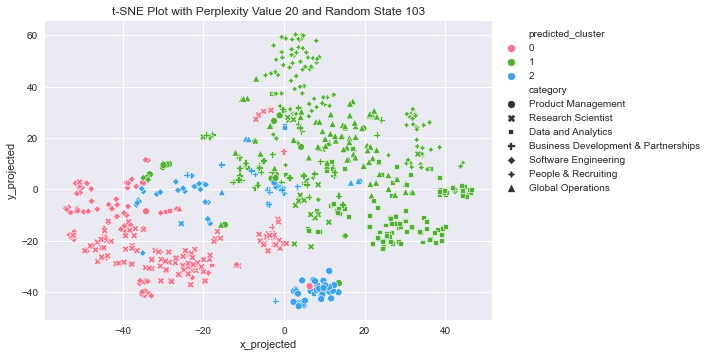

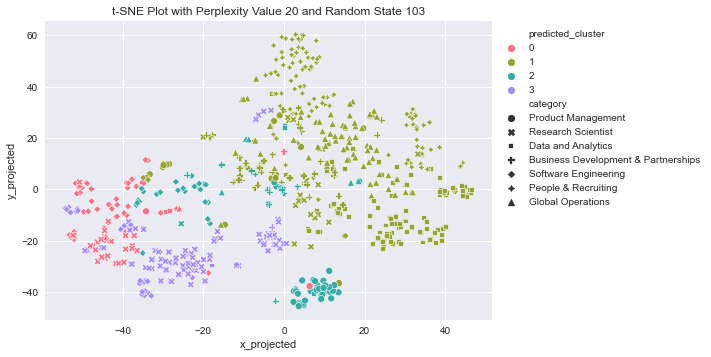

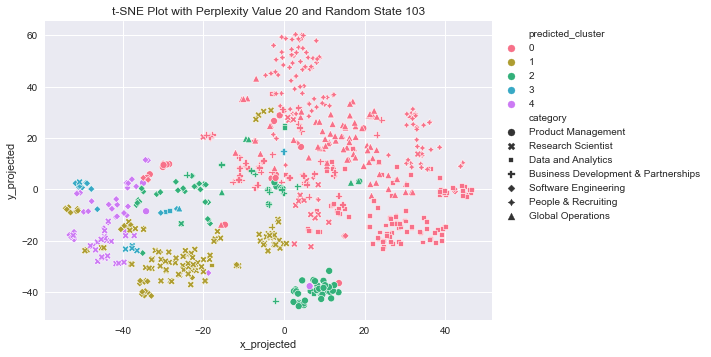

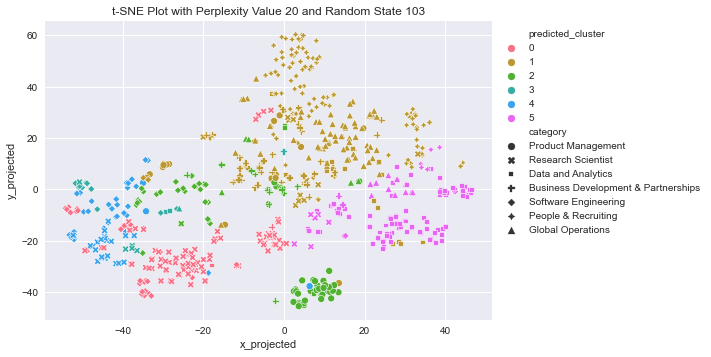

...

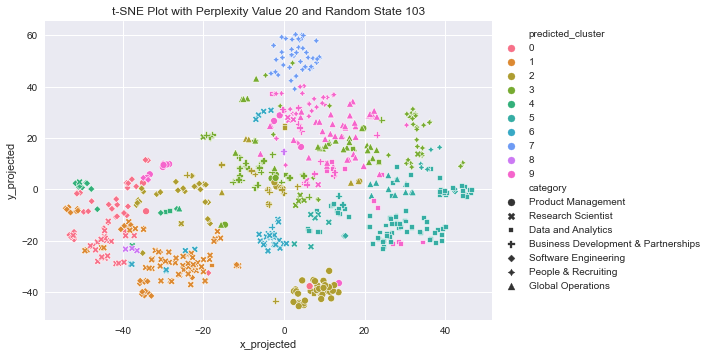

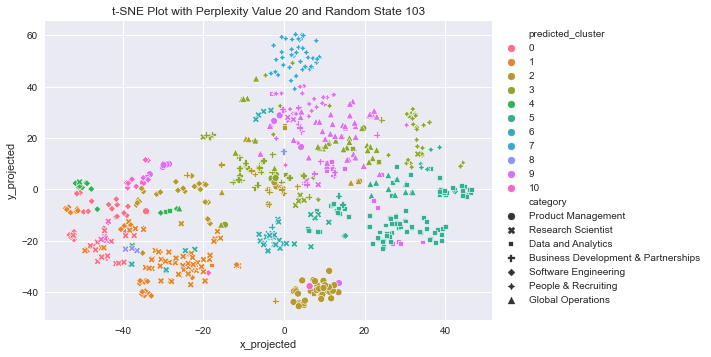

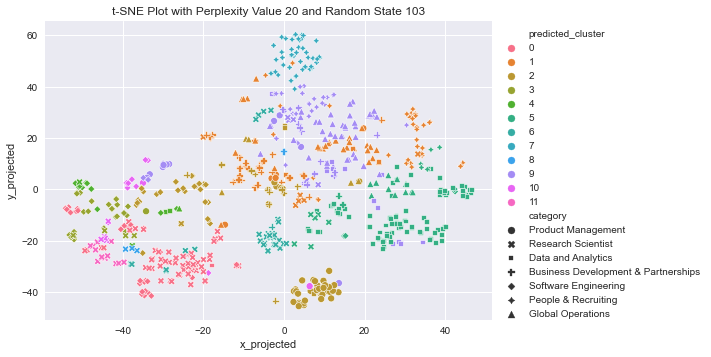

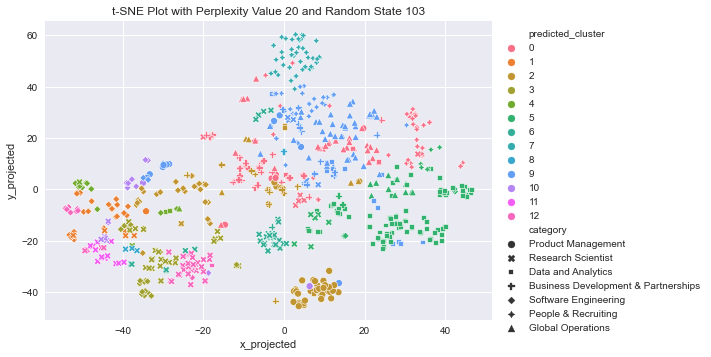

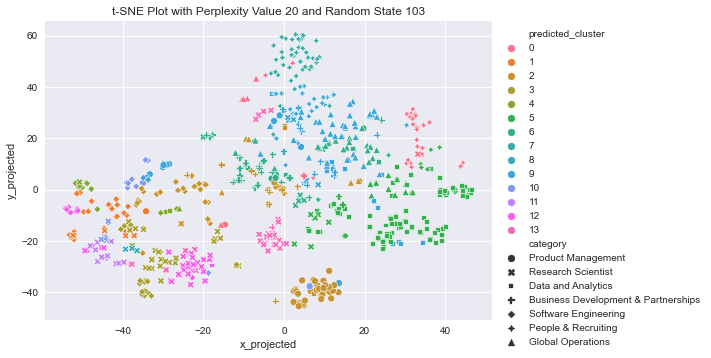

In [31]:
tsne = TSNE(n_components=2, perplexity=20, random_state=103)
data_tsne = tsne.fit_transform(tfidf_matrix_np_info)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([df, df_tsne], axis=1)
for k in range(2,15):
    #Clustering from dendrogram with k clusters
    hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='complete')
    df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)
    
    #Map the resulting cluster labels onto our chosen t-SNE plot
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
    plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()

### 7.3. Clustering Algorithm Results Presentation

* We will be using the t-SNE plots instead of the dendogram, because it is easier to interpret it and the provided results are the same.

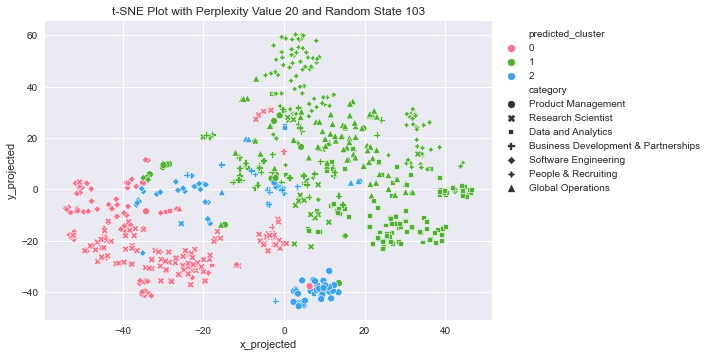

In [32]:
k = 3
#Clustering from dendrogram with k clusters
hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='complete')
df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)

#Map the resulting cluster labels onto our chosen t-SNE plot
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

* We believe that the HAC with complete linkage with k=3 provides a good representation of how the three main clusters of our data look, where:
    * 1) The cluster to the left mostly contains Research Scientist and Software Engineer job categories, which show a high level of similarity between them
    * 2) The cluster at the bottom mostly contains Product Management job categories, which shows that Product Management is very different from the other two clusters. However, it also contains some observations from the other job categories, which mean that these job postings were very similar to Product Management category.
    * 3) The cluster to the right mostly contains all the other job categories, which show that there is a high level of similarity among them, however we can continue our analysis further as this cluster has some sub-clusters

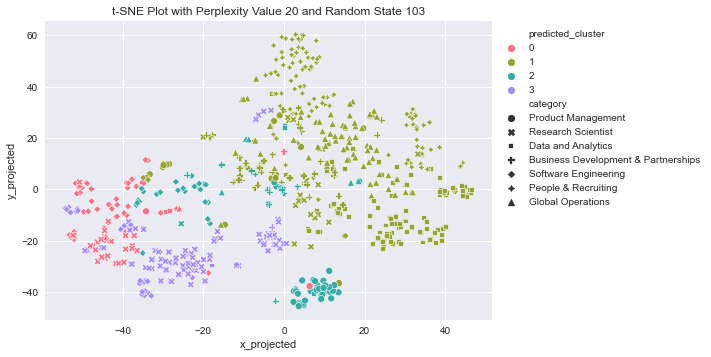

In [33]:
k = 4
#Clustering from dendrogram with k clusters
hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='complete')
df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)

#Map the resulting cluster labels onto our chosen t-SNE plot
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

* At k=4, we see that the cluster at the left is divided into two sub-clusters, one consists mostly of Research Scientist job category and the other combines Research Scientist and Software Engineering job categories, which mean that there are some Research Scientist job postings that are very similar to Software Engineering job postings.

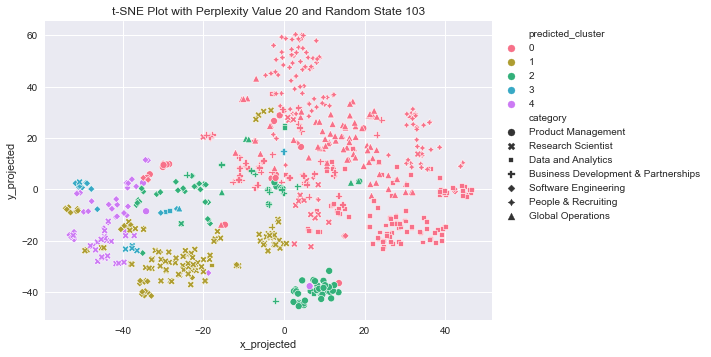

In [34]:
k = 5
#Clustering from dendrogram with k clusters
hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='complete')
df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)

#Map the resulting cluster labels onto our chosen t-SNE plot
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

* At k=5, we do not see a very meaningful division into subclusters, because as we already know the complete linkage tends to split the main clusters apart.

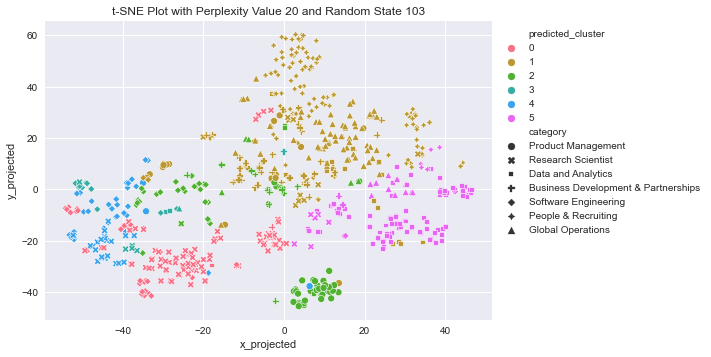

In [35]:
k = 6
#Clustering from dendrogram with k clusters
hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='complete')
df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)

#Map the resulting cluster labels onto our chosen t-SNE plot
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

* At k=6, we get the new sub-cluster, which consists mostly of Data and Analytics job postings

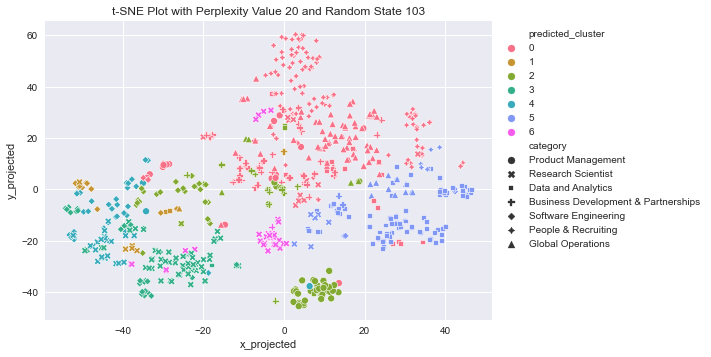

In [36]:
k = 7
#Clustering from dendrogram with k clusters
hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='complete')
df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)

#Map the resulting cluster labels onto our chosen t-SNE plot
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

* At k=7, we get a new sub-cluster that consists only of Research Scientist positions. This means that Research Scientist positions could have different sub-categories.

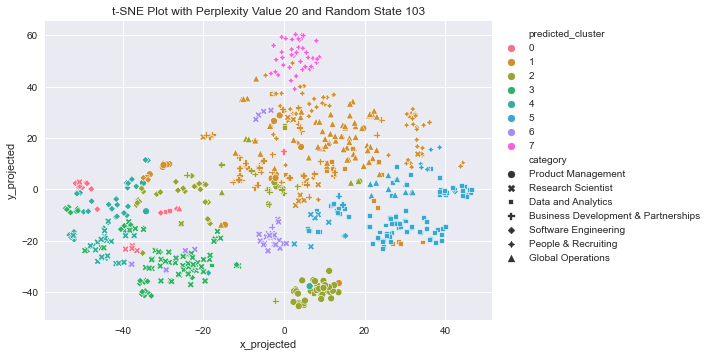

In [37]:
k = 8
#Clustering from dendrogram with k clusters
hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='complete')
df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)

#Map the resulting cluster labels onto our chosen t-SNE plot
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

* At k=8, we get a new sub-cluster consisting only of People & Recruiting job postings, which means that it's somewhat different from the other clusters.

* We think that **k=8 provides the best clustering for our data**, because for k>8, the new clusterings are not very meaningful anymore.

### 7.4. Assessing Clustering Separation and Cohesion

#### 7.4.1 Average Silhouette score for k=8

* k=8 provides the best clustering of our data, so we calculate the average Silhouette score for k=8

In [38]:
hac = AgglomerativeClustering(n_clusters=8, affinity='euclidean', linkage='complete')
Y_pred = hac.fit_predict(tfidf_matrix_np_info)
silhouette_score(tfidf_matrix_np_info, Y_pred)

0.04271247778364925

* The average Silhouette score for k=8 is 0.0427, which shows that there a high amount of overlap between the clusters

#### 7.4.2 Assessing the Cohesion and Separation of the Clusters in a Clustering: Creating a Silhouette Plot for the Clustering

* Function to plot the Silhouette Plot for the Clustering:

In [30]:
def show_silhouette_plots(X,cluster_labels):

    # This package allows us to use "color maps" in our visualizations
    import matplotlib.cm as cm
    
    #How many clusters in your clustering?
    n_clusters=len(np.unique(cluster_labels))    

    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient fcan range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])


    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]
    

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.show()
    
    return

For n_clusters = 8 The average silhouette_score is : 0.04271247778364925


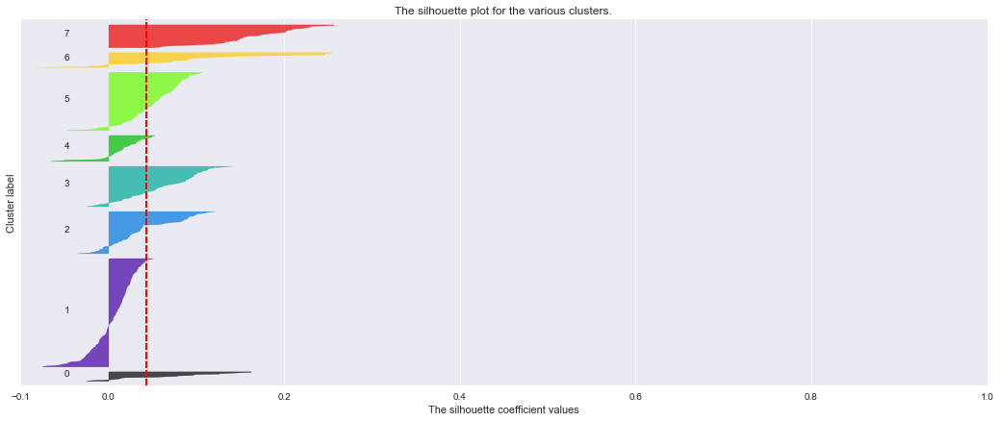

In [40]:
show_silhouette_plots(tfidf_matrix_np_info, hac.labels_)

* The silhouette plot above is essentially a bar plot that plots the silhouette score for each of the observations (job postings) in the dataset within the clustering. The observations are grouped together based on the cluster that they are assigned to in hac complete linkage algorithm and sorted (within each cluster) from highest silhouette score to lowest silhouette score value.

<u>Evaluating the Cohesion and Separation of Each of the Clusters in the Clustering</u>
* Cluster 7 has the highest amount of cohesion and separation (on average), because all of the observation have very high Silhouette score and there are no observations with negative Silhouette score. 
* Clusters 0 and 6 have the next best amount of cohesion and separation (on average), as their shapes are about the same. and there are only several observations that have a negative Silhouette score. There are not so many observations assigned to these clusters.
* Clusters 2, 3, 4 and 5 have approximately the same amount of cohesion and separation (on average). There are some observation with negative Silhouette score, but these values are insignificant.
* Cluster 1 has the lowest amount of cohesion and separation (on average). Half of the objects (the ones with negative silhouette score values) are closer to other clusters than the one that they were assigned to. However, the Silhouette scores are still very close to 0, so this does not affect our results much, because it is evident that there is an overlap in our clusters. Cluster 1 is also the largest cluster among all the clusters.

### 7.5. Additional Analysis

* **Calculating the Adjusted RAND index between the clustering and the category labels**

In [41]:
df['predicted_cluster']=hac.labels_
df.head()

,category,company,title,description,basic_qualifications,preferred_qualifications,country,state,qualifications,information,predicted_cluster
0,Product Management,Facebook,Product Manager - Consumer Software (Facebook ...,"Lead the ideation, technical development, and ...",3+ years product management experience or simi...,"Experience developing social products, technol...",US,CA,3+ years product management experience or simi...,"Lead the ideation, technical development, and ...",2
1,Product Management,Facebook,Product Manager - Platform (Facebook Reality L...,"Lead the ideation, technical development, and ...",4+ years product management experience with 2+...,Experience working on a successful developer a...,US,CA,4+ years product management experience with 2+...,"Lead the ideation, technical development, and ...",2
2,Product Management,Facebook,Product Manager,"Display strong leadership, organizational and ...",5+ years product management or related industr...,Experience of going through a full product lif...,US,CA,5+ years product management or related industr...,"Display strong leadership, organizational and ...",2
3,Product Management,Facebook,Product Management Leader,"Lead a team through the ideation, technical de...",8+ years of experience in Product Management a...,Experience in a consumer focused technology co...,US,CA,8+ years of experience in Product Management a...,"Lead a team through the ideation, technical de...",2
4,Product Management,Facebook,Product Management Lead,"Lead a team through the ideation, technical de...",6+ years of experience in Product Management a...,Experience in a consumer focused technology co...,US,CA,6+ years of experience in Product Management a...,"Lead a team through the ideation, technical de...",2


In [42]:
adjusted_rand_score(df['category'], df['predicted_cluster'])

0.27296699680477976

* The adjusted RAND index between the clustering and the category labels is 0.27, which is not very low, but is not very high either. It is somewhat closer to 0 then it is to 1 and this indicates that this clustering with k=8 clusters is only slightly more similar to the set of pre-assigned class labels than a randomly generated clustering of the dataset with k=8 clusters.

* **Calculating the Homogeneity and Completeness scores**

In [43]:
# Homogeneity Score
homogeneity_score(df['category'], df['predicted_cluster'])

0.43329307825941477

* Homogeneity measures how much the samples in a cluster are similar. We got the homogeneity score of 0.43, which shows that we have a medium homegeneity for our clusters (on average). This shows that some of our clusters have observations from several job categories, which may show the similarity between these job postings.

In [44]:
# Completeness Score
completeness_score(df['category'], df['predicted_cluster'])

0.4474108556942776

* The completeness score value is between 0 and 1, which shows that we have somewhat medium completeness for our clusters (on average). This shows that some of our pre-assigned category labels are not clustered into the same cluster with our HAC complete linkage algorithm.

* **For our clusterings with k=8 clusters, we color code the points in our selected t-SNE plot with the respective cluster labels. And we also define the shape of the points by the job category.**

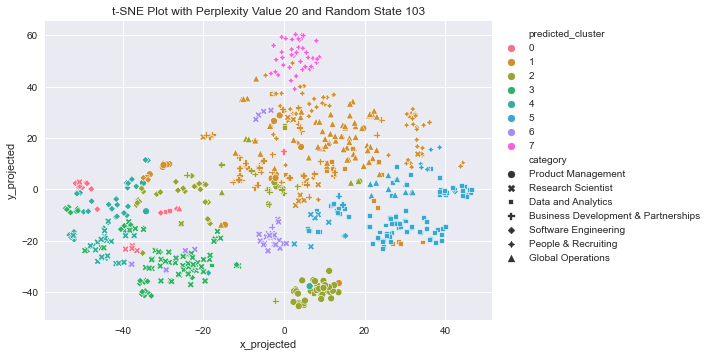

In [45]:
k = 8
#Clustering from dendrogram with k clusters
hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='complete')
df_combo['predicted_cluster'] = hac.fit_predict(tfidf_matrix_np_info)

#Map the resulting cluster labels onto our chosen t-SNE plot
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster', palette=sns.color_palette("husl", k), style = df['category'], data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(20, 103))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

* The results from t-SNE plot match the respective values of adjusted RAND index, homogeneity score and completeness score:
    * From this t-SNE, it is evident that the clustering is only slightly more similar to the set of pre-assigned class labels than a randomly generated clustering of the dataset with k=8 clusters, because most of the values in cluster 1 and cluster 2 contain a lot of observations from different job categories that lowers the average RAND index. 
    * What about the homogeneity score, the medium value of this score is justified, as some clusters have very high homogeneity score (clusters 3, 4, 6 and 7) and others have very low homogeneity score (clusters 0, 1, 2 and 5).
    * What about the completeness score, the medium value of this score is justified, because some job categories have very high completeness score (Product Management, Data and Analytics and Global Operations) and other job categories have very low completeness score (Research Scientist, Business Development & Partnerships, Software Engineering and People and Recruiting).

### 7.6. Describing Each of the Clusters

* The dictionary below is created to see what are job categories in each cluster and what is the number of job postings for each category

In [46]:
categories_per_cluster = {}
for i in range(8):
    count_dictionary = {}
    for value in df.category[df["predicted_cluster"]==i].unique():
        count_dictionary[value] = len(df.category[df["predicted_cluster"]==i][df["category"] == value])
    categories_per_cluster[i] = count_dictionary
categories_per_cluster

{0: {'Data and Analytics': 3,
  'Software Engineering': 11,
  'Research Scientist': 5,
  'Business Development & Partnerships': 2,
  'Global Operations': 1},
 1: {'Product Management': 16,
  'Data and Analytics': 19,
  'Business Development & Partnerships': 47,
  'Software Engineering': 3,
  'People & Recruiting': 69,
  'Research Scientist': 12,
  'Global Operations': 77},
 2: {'Product Management': 42,
  'Data and Analytics': 3,
  'Business Development & Partnerships': 12,
  'Software Engineering': 32,
  'Research Scientist': 1,
  'Global Operations': 5},
 3: {'Research Scientist': 62,
  'Data and Analytics': 1,
  'Software Engineering': 28},
 4: {'Product Management': 3,
  'Software Engineering': 33,
  'Research Scientist': 23},
 5: {'Data and Analytics': 98,
  'Software Engineering': 4,
  'Research Scientist': 9,
  'People & Recruiting': 6,
  'Global Operations': 12,
  'Business Development & Partnerships': 2},
 6: {'Research Scientist': 33, 'Business Development & Partnerships': 1}

* From the dictionary above we can see that:
    * Software Engineering job category has four sub-categories which were clustered to clusters 0, 2, 3 and 4. 
    * Data and Analytics job category was mostly clustered to cluster 5 and also there is a small sub-category which was clustered to cluster 1. 
    * Research scientist job category has mostly been clustered to cluster 6 and there is a sub-category which is very similar to Software Engineering sub-category in clusters 3 and 4. 
    * Business Development & Partnerships job category mostly went to cluster 1, which is the largest cluster containing a mix of all job categories, the observations of which are very similar to each other. 
    * People & Recruiting job category has a separate cluster 7 and also many of the job postings from this job category were clustered in cluster 1. 
    * Most of the Product Management job postings were clustered in a separate cluster 2, which shows that this job category has a significantly different description from others. There are some observations which went to cluster 1, which may show that the description of these job postings included very similar words with other job categories. 
    * Finally, Global Operations were mostly clustered to cluster 1.


* To describe each of our clusters by their composition of words, let's plot the word clouds for each of our clusters and see what is the similar words between the clusters.

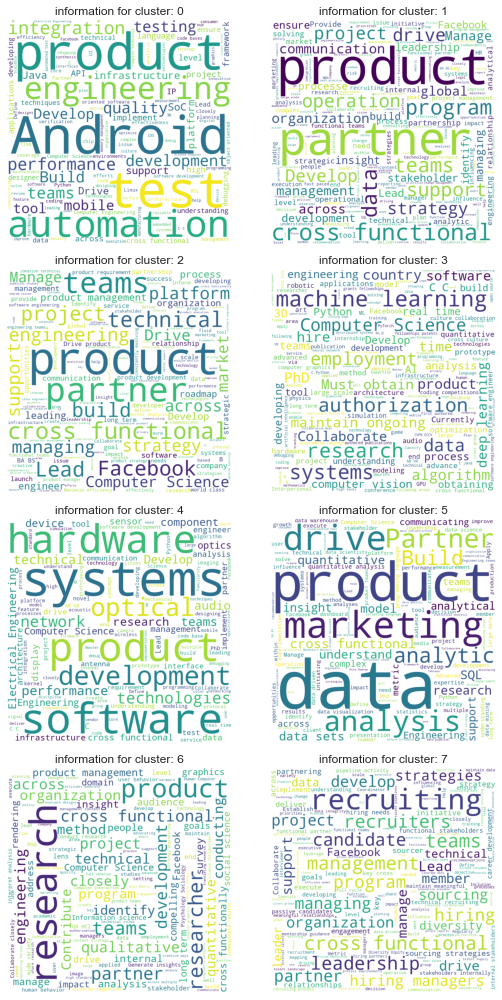

In [47]:
num_row = 4
num_col = 2

# get a segment of the dataset
num = num_row*num_col

# plot images
fig, axes = plt.subplots(num_row, num_col, figsize=(4*num_col,3.5*num_row))

for i in range(num_row* num_col):
    try:
        wordcloud = plot_wordcloud(df.information[df.predicted_cluster==i])
        ax = axes[i//num_col, i%num_col]
        ax.imshow(wordcloud)
        ax.axis("off")
        ax.set_title(f'information for cluster: {i}')
    except:
        pass

plt.tight_layout()
plt.show()

* Cluster 0 shows the words that are the most frequent in the Software Engineering sub-category (as defined previously), such as Android, product, test, automation and engineering, this sub-category may show that these job postings are for software engineers in mobile applications.
* Cluster 1 show the words such as product, partner, cross-functional, strategy, leadership which were the most common words for Business Development & Partnerships, People & Recruiting and Global Operations job categories. 
* Cluster 2 shows the less technical words for Product Management job category and the other Software Engineering roles may be similar in description as they might similarly require less technical skills, which means that this could be the manager roles. 
* Cluster 3 has a lot of machine learning words, which shows that these Software Engineering and Research Scientist job postings require a more knowledge in machine learning and deep learning, so this could be the machine learning engineer role. 
* Cluster 4 shows purely software engineering words, but there are also some Research Scientist job postings that are similar in description
* Cluster 5 words are clearly related to Data and Analytics job category. 
* Cluster 6 shows the words for only Research Scientist job postings. Cluster 7 shows the words that are mostly met in People & Recruiting job postings.

## 8. Clustering Algorithm 2 (Latent Dirichlet allocation algorithm)



### 8.1. Parameter Selection

There are two important parameters in LDA:

1. Alpha parameter (what topics a document is about): This parameter is Dirichlet prior concentration parameter which controls document-topic density. Higher the alpha value, more are the topics by which documents are made up of and it results in more specific topic distribution for each document.

2. Beta parameter (what words define a topic): This paramter is prior concentration which controls topic-word density. higher the value of beta, more words are there in the topics and it results in more specific word distribution for each topic.

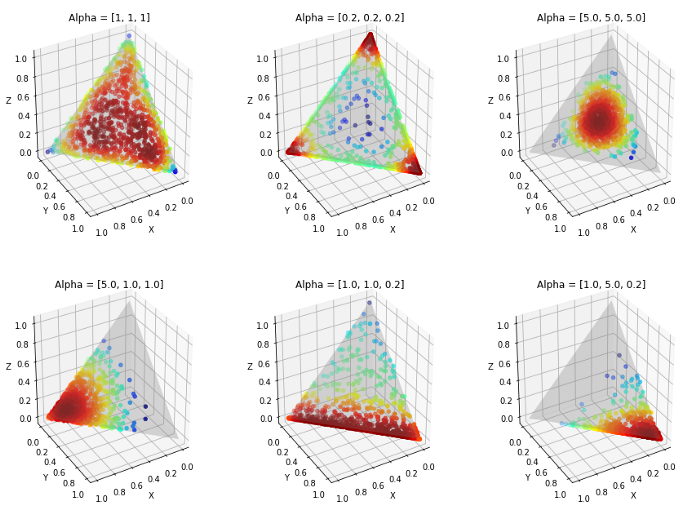

image source: https://towardsdatascience.com/light-on-math-machine-learning-intuitive-guide-to-latent-dirichlet-allocation-437c81220158

- To find right values of $\alpha$ and $\beta$ parameters, we need to create multiple models and evaluate these with specific values of $\alpha$ and $\beta$. We can evaluate these moodels either by human judgement or intrinsic evaluation metrics. Evaluating the models by eye balling topic words is not feasible. Hence we need to use an objective metric.

- Evaluating topic modeling algorithms based on objective measures has been one of the most difficult task. Perplexity had often been used as an intrinsic evaluation measure. It measures how suprised a model is to new data that it has not seen before. It measures the normalized log-likelihood of a held-out test set. However, recent research has shown that perplexity (predictive likelihood) and human judgement are often do not agree with each other. Hence, topic coherence is an alternative to perplexity that we can use for paramter selection.

- **Topic Coherence** scores a single topic based on the degree of semantic similarity between high scoring words in the topic. **Semantic similarity** is the task of determining how similar two words/ sentences are based on thier meaning. A set of sentences or facts are said to be coherent, if they support each other. We will use topic coherence score to select alpha and beta parameters.

Below we will perform hyperparamter tuning to select appropriate  $\alpha$ and $\beta$ values. The results will be stored in lda_tuning_results_top_skills.csv file.

In [77]:
# supporting function
from gensim.models import CoherenceModel
def compute_coherence_values(corpus, dictionary, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [33]:
import numpy as np
import tqdm
import gensim

grid = {}
grid['Validation_Set'] = {}

# Topics range
min_topics = 2
max_topics = 11
step_size = 1
topics_range = range(min_topics, max_topics, step_size)

# Alpha parameter
alpha = list(np.arange(0.01, 1, 0.3))
alpha.append('symmetric')
alpha.append('asymmetric')

# Beta parameter
beta = list(np.arange(0.01, 1, 0.3))
beta.append('symmetric')

# Validation sets
num_of_docs = len(corpus)
corpus_sets = [gensim.utils.ClippedCorpus(corpus, int(num_of_docs*0.75)), 
               corpus]

corpus_title = ['75% Corpus', '100% Corpus']

model_results = {'Validation_Set': [],
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }

# Can take a long time to run
if 1 == 1:
    pbar = tqdm.tqdm(total=(len(beta)*len(alpha)*len(topics_range)*len(corpus_title)))
    
    # iterate through validation corpuses
    for i in range(len(corpus_sets)):
#     i = 1
        # iterate through number of topics
        for k in topics_range:
            # iterate through alpha values
            for a in alpha:
                # iterare through beta values
                for b in beta:
                    # get the coherence score for the given parameters
                    cv = compute_coherence_values(corpus=corpus_sets[i], dictionary=id2word, 
                                                  k=k, a=a, b=b)
                    # Save the model results
                    model_results['Validation_Set'].append(corpus_title[i])
                    model_results['Topics'].append(k)
                    model_results['Alpha'].append(a)
                    model_results['Beta'].append(b)
                    model_results['Coherence'].append(cv)

                    pbar.update(1)
        pd.DataFrame(model_results).to_csv('./results/lda_tuning_results_top_skills.csv', index=False)
    pbar.close()

In [78]:
result_hy_opt = pd.read_csv('./results/lda_tuning_results_top_skills.csv')
result_hy_opt.head()

,Validation_Set,Topics,Alpha,Beta,Coherence
0,75% Corpus,7,symmetric,0.91,0.469246
1,75% Corpus,7,0.31,0.91,0.466774
2,75% Corpus,7,0.01,0.91,0.464637
3,75% Corpus,7,asymmetric,0.61,0.443427
4,75% Corpus,5,0.01,0.61,0.438970


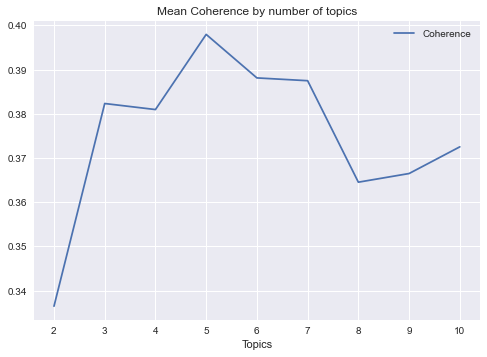

In [79]:
result_hy_opt.groupby(by=['Topics']).mean().plot()
plt.title('Mean Coherence by number of topics')
plt.show()

As we can see from above plot, when number of topics chosen are 5, there is highest mean coherence.

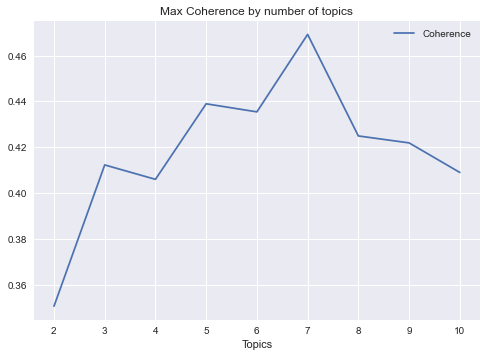

In [80]:
result_hy_opt.groupby(by=['Topics']).max().plot()
plt.title('Max Coherence by number of topics')
plt.show()

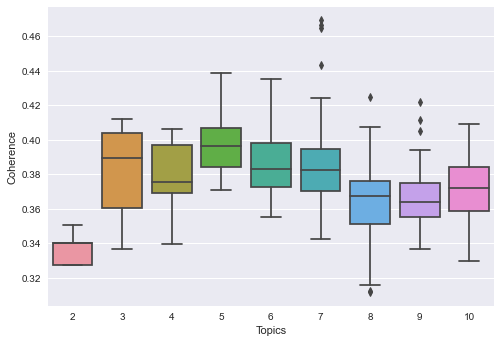

In [81]:
ax = sns.boxplot(x="Topics", y="Coherence", data=result_hy_opt)

From above plot, we can see maximum topic coherence is obtained when number of topics are 7.

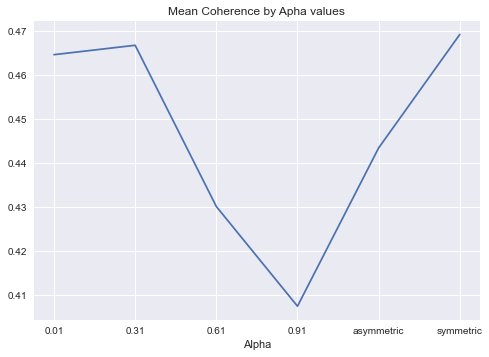

In [82]:
result_hy_opt.groupby(by=['Alpha']).max()['Coherence'].plot()
plt.title('Mean Coherence by Apha values')
plt.show()

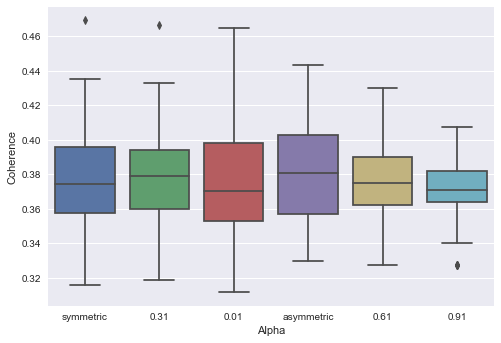

In [83]:
ax = sns.boxplot(x="Alpha", y="Coherence", data=result_hy_opt)

At $\alpha$ = 0.31, there is max coherence.

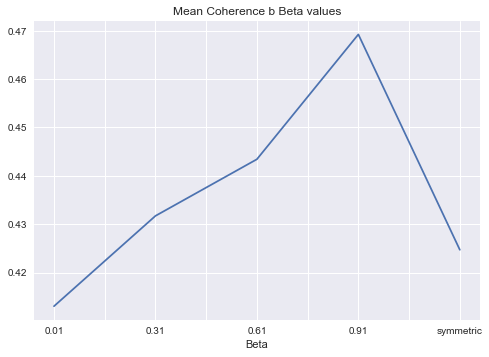

In [84]:
result_hy_opt.groupby(by=['Beta']).max()['Coherence'].plot()
plt.title('Mean Coherence b Beta values')
plt.show()

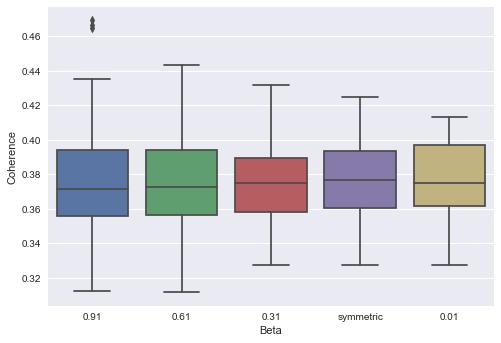

In [85]:
ax = sns.boxplot(x="Beta", y="Coherence", data=result_hy_opt)

At $\beta$ = 0.91, there is max coherence.

In [86]:
result_hy_opt[(result_hy_opt.Alpha=='0.31') & (result_hy_opt.Beta=='0.91')]

,Validation_Set,Topics,Alpha,Beta,Coherence
1,75% Corpus,7,0.31,0.91,0.466774
7,75% Corpus,6,0.31,0.91,0.432793
65,75% Corpus,3,0.31,0.91,0.404032
84,75% Corpus,5,0.31,0.91,0.400889
167,75% Corpus,4,0.31,0.91,0.387217
173,100% Corpus,5,0.31,0.91,0.386094
224,75% Corpus,10,0.31,0.91,0.379915
263,100% Corpus,4,0.31,0.91,0.374800
305,100% Corpus,10,0.31,0.91,0.371128
347,100% Corpus,7,0.31,0.91,0.367065


* We see that above combination of alpha and beta values gives highest topic coherence. We also see that for number of topics are 5, there is higher mean coherence and when number of topics are 7, there is max topic coherence. Hence, we will consider these two number of cluster options.

### 8.2. Clustering Algorithm

In [87]:
import gensim
# import pyLDAvis.gensim
import pyLDAvis.gensim_models as gensimvis
import pickle 
import pyLDAvis
import os
from pprint import pprint

num_topics = 5

lda_model_5 = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           passes=200,
                                           alpha=0.31,
                                           eta=0.91)

# Visualize the topics
pyLDAvis.enable_notebook()

LDAvis_data_filepath = os.path.join('./results/ldavis_tuned_'+str(num_topics)+'final')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim_models.prepare(lda_model_5, corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)

# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)

pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_tuned_'+ str(num_topics) +'final.html')

In [88]:
num_topics = 7

lda_model_7 = gensim.models.LdaMulticore(corpus=corpus,
                                         
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           passes=200,
                                           alpha=0.31,
                                           eta=0.91)

# Visualize the topics
pyLDAvis.enable_notebook()

LDAvis_data_filepath = os.path.join('./results/ldavis_tuned_'+str(num_topics)+'final')

# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared_7 = pyLDAvis.gensim_models.prepare(lda_model_7, corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared_7, f)

# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared_7 = pickle.load(f)

pyLDAvis.save_html(LDAvis_prepared_7, './results/ldavis_tuned_'+ str(num_topics) +'final.html')

### 8.3. Clustering Algorithm Results Presentation

In [89]:
from IPython.display import IFrame

IFrame(src='./results/ldavis_tuned_5final.html', width=700, height=600)

In [94]:
pprint(lda_model_5.print_topics())

[(0,
  '0.011*"sql" + 0.010*"data" + 0.009*"analysis" + 0.009*"quantitative" + '
  '0.008*"python" + 0.008*"r" + 0.008*"statistic" + 0.007*"engineering" + '
  '0.007*"statistical" + 0.007*"product"'),
 (1,
  '0.009*"management" + 0.009*"partner" + 0.008*"cross" + 0.008*"functional" + '
  '0.008*"cross functional" + 0.007*"data" + 0.007*"project" + 0.007*"process" '
  '+ 0.007*"strategy" + 0.007*"across"'),
 (2,
  '0.011*"product" + 0.009*"cross" + 0.008*"functional" + 0.008*"cross '
  'functional" + 0.007*"drive" + 0.007*"partner" + 0.007*"engineering" + '
  '0.007*"development" + 0.006*"facebook" + 0.006*"across"'),
 (3,
  '0.012*"computer" + 0.011*"science" + 0.010*"c" + 0.010*"computer science" + '
  '0.010*"software" + 0.008*"engineering" + 0.008*"time" + 0.008*"python" + '
  '0.008*"product" + 0.008*"develop"'),
 (4,
  '0.009*"product" + 0.008*"research" + 0.008*"management" + 0.008*"product '
  'management" + 0.008*"engineer" + 0.008*"creative" + 0.008*"user" + '
  '0.007*"analys

* We can see in the above visualization that when we use number of topics equal to 5, we see that the number of topics are balanced in size. There is a bit of overlap too, which might indicate that there are some topics that are close to each other. This will help us to answer the question on how these jobs are related to each other. You can also interactively hover over the above visualtion. You may choose to adjust the relevance metric.

In [93]:
IFrame(src='./results/ldavis_tuned_7final.html', width=700, height=600)

In [95]:
pprint(lda_model_7.print_topics())

[(0,
  '0.011*"sql" + 0.010*"data" + 0.010*"analysis" + 0.009*"r" + '
  '0.009*"quantitative" + 0.009*"python" + 0.009*"statistic" + '
  '0.008*"statistical" + 0.007*"engineering" + 0.007*"product"'),
 (1,
  '0.011*"computer" + 0.011*"software" + 0.011*"computer science" + '
  '0.011*"science" + 0.009*"product" + 0.009*"technical" + 0.008*"build" + '
  '0.008*"development" + 0.008*"b" + 0.008*"engineer"'),
 (2,
  '0.010*"product" + 0.009*"marketing" + 0.009*"cross" + 0.009*"strategy" + '
  '0.008*"cross functional" + 0.008*"partnership" + 0.008*"functional" + '
  '0.008*"partner" + 0.007*"drive" + 0.007*"market"'),
 (3,
  '0.010*"computer" + 0.010*"research" + 0.010*"time" + 0.009*"science" + '
  '0.009*"learning" + 0.009*"c" + 0.009*"machine" + 0.008*"develop" + '
  '0.008*"computer science" + 0.008*"machine learning"'),
 (4,
  '0.009*"product" + 0.009*"engineer" + 0.008*"management" + 0.008*"research" '
  '+ 0.008*"product management" + 0.008*"creative" + 0.007*"user" + '
  '0.007*"t

- We can see in the above visualization that when we use number of topics equal to 7, we see that the number of topics are approximately balanced in size. There is a bit of overlap too, which might indicate that there are some topics that are close to each other. This will help us to answer the question on how these jobs are related to each other. You can also interactively hover over the above visualtion. You may choose to adjust the relevance metric.

- Since in our original dataset, there are 7 job categories, the above results from LDA matches to our original categories.

### 8.4. Assessing Clustering Separation and Cohesion

- As discussed in the parameter selection section 8.1, we can use Coherence score to understand cohesion. We obtained coherence score of 0.51 with number of topics equal to 7. This is a very good score if we look at the paramter selection results. 

- When number of topics are chosen as 5, coherence score is 0.45. This result matches with our analysis on hyperparameter tuning.

- We can see in the visualization from section 8.3 that for number of topics equal to 5, all topics are well seperated except 1 and 2. We will learn more about these topics characteristics in the section 8.6. Also, when number of topics chosen are 7, cluster 4 and 7 are well separated from all. Cluster 2, 7 and cluster 3,1,6 are close to each other. We will also look into these cluster and try to understand why these are close to each other. This will also answer our research questions.

In [96]:
# Compute Coherence Score for 5 topics model
coherence_model_lda = CoherenceModel(model=lda_model_5, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.4555320258214953


In [97]:
# Compute Coherence Score for 7 topics model
coherence_model_lda = CoherenceModel(model=lda_model_7, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.5108166792224088


#### 8.4.1 Encode Topics to Integers

In [98]:
pred = [lda_model_7[corpus[x]][0][0] for x in range(len(corpus))]
pred[:10]

[4, 4, 4, 4, 4, 4, 4, 4, 4, 4]

In [99]:
unique, counts = np.unique(pred, return_counts=True)
unique, counts

(array([0, 1, 2, 3, 4, 5, 6]),
 array([226, 158, 124,  75,  40,  70,  34], dtype=int64))

In [100]:
pprint(lda_model_7.print_topics())

[(0,
  '0.011*"sql" + 0.010*"data" + 0.010*"analysis" + 0.009*"r" + '
  '0.009*"quantitative" + 0.009*"python" + 0.009*"statistic" + '
  '0.008*"statistical" + 0.007*"engineering" + 0.007*"product"'),
 (1,
  '0.011*"computer" + 0.011*"software" + 0.011*"computer science" + '
  '0.011*"science" + 0.009*"product" + 0.009*"technical" + 0.008*"build" + '
  '0.008*"development" + 0.008*"b" + 0.008*"engineer"'),
 (2,
  '0.010*"product" + 0.009*"marketing" + 0.009*"cross" + 0.009*"strategy" + '
  '0.008*"cross functional" + 0.008*"partnership" + 0.008*"functional" + '
  '0.008*"partner" + 0.007*"drive" + 0.007*"market"'),
 (3,
  '0.010*"computer" + 0.010*"research" + 0.010*"time" + 0.009*"science" + '
  '0.009*"learning" + 0.009*"c" + 0.009*"machine" + 0.008*"develop" + '
  '0.008*"computer science" + 0.008*"machine learning"'),
 (4,
  '0.009*"product" + 0.009*"engineer" + 0.008*"management" + 0.008*"research" '
  '+ 0.008*"product management" + 0.008*"creative" + 0.007*"user" + '
  '0.007*"t

Based on above top words below are the topics.

Topic 0: Data and Analytics

Topic 1: Software Engineering

Topic 2: Global Operations

Topic 3: Research Scientist

Topic 4: Product Management

Topic 5: People & Recruiitng

Topic 6: Business Development & Partnerships

In [101]:
df.category.unique()

array(['Product Management', 'Research Scientist', 'Data and Analytics',
       'Business Development & Partnerships', 'Software Engineering',
       'People & Recruiting', 'Global Operations'], dtype=object)

In [102]:
encoded_categories = df.category

In [103]:
category_mapping = {'Product Management':4, 'Research Scientist':3, 'Data and Analytics':0,
       'Business Development & Partnerships':6, 'Software Engineering':1,
       'People & Recruiting':5, 'Global Operations':2}

In [104]:
encoded_categories = np.array(encoded_categories.map(category_mapping))

In [105]:
encoded_categories[:10]

array([4, 4, 4, 4, 4, 4, 4, 4, 4, 4], dtype=int64)

#### 8.4.2 Average Silhouette score

In [123]:
silhouette_score(tfidf_matrix_np_info, pred)

0.028550578546477356

The average Silhoutte score of ~ 0.03 indicates that there is a high degree of overlap among the clusters.

For n_clusters = 7 The average silhouette_score is : 0.028550578546477356


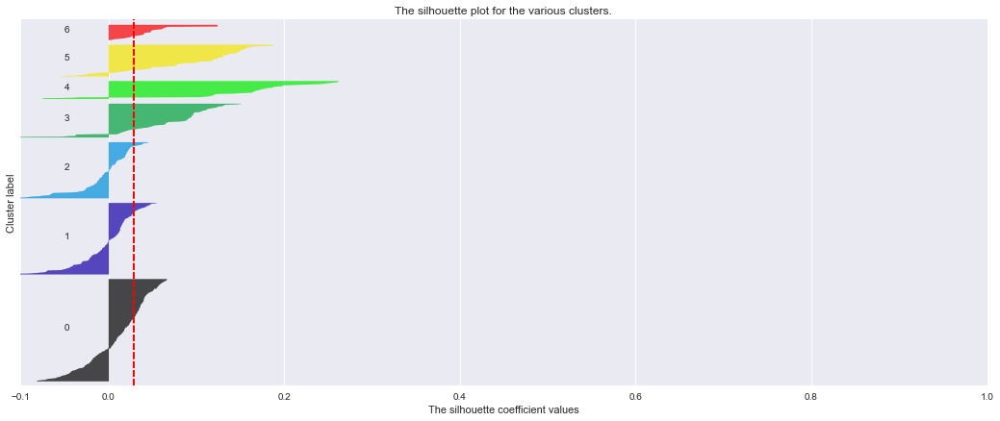

In [110]:
show_silhouette_plots(tfidf_matrix_np_info, np.array(pred))

<u>Evaluating the Cohesion and Separation of Each of the Clusters in the Clustering</u>
- Cluster 6 has highest amount of cohesion and separation. All of the objects are correctly put in the cluster and there is a high degree of separation.
- Cluster 5 and 3 have similar cohesion and separation.
- Cluster 4 has high silhoutte score compared to other clusters. There are few objects that have negative silhoutte score.
- Cluster 0, 1, and 2 have low cohesion and separation. Almost half of the objects in these clusters overlap with other clusters.

### 8.5. Additional Analysis

#### 8.5.2 Adjusted Rand Index

In [111]:
from sklearn.metrics import adjusted_rand_score
adjusted_rand_score(encoded_categories, pred)

0.2555552143139126

- We can see that adjusted rand score between predicted topics and actual topics is 0.25. We do see that many of our pre-assigned labels match with the predicted label. But majority of these do not match. The reason for this is because Global Operations, Business Development & Partnerships and product management are having very similar words.

- However as we have learnt through this class that accurate classification is not often our goal in an unsupervised learning analysis. Rather, the useful insight is important. I think through this project we have achieved that.

In [112]:
dictionary_data = {'pred': pred, 'actual': encoded_categories}
pred_df = pd.DataFrame(dictionary_data)
pred_df.head()

,pred,actual
0,4,4
1,4,4
2,4,4
3,4,4
4,4,4


In [113]:
filtered_pred_df = pred_df[~pred_df.actual.isin([4,6,2])]

In [114]:
adjusted_rand_score(filtered_pred_df.actual, filtered_pred_df.pred)

0.3143827709221188

- We can see that for software engineering, research scientist, people & recruiting, data and analytics, adjusted rand score is higher compared to all categories.

In [115]:
filtered_pred_df

,pred,actual
14,6,3
28,2,0
40,4,0
45,2,0
62,1,1
...,...,...
591,5,5
592,5,5
593,6,5
594,2,5


In [116]:
for key, val in category_mapping.items():
    filtered_pred_df = pred_df[~pred_df.actual.isin([val])]
    adj_score = adjusted_rand_score(filtered_pred_df.pred, filtered_pred_df.actual)
    print(key, val, adj_score)

Product Management 4 0.2602877620559375
Research Scientist 3 0.3173572958376808
Data and Analytics 0 0.262531074286098
Business Development & Partnerships 6 0.2600323698314352
Software Engineering 1 0.2278295961021901
People & Recruiting 5 0.26098774053834134
Global Operations 2 0.30798976055283145


- From above result, we can observe that for software engineering, most of the predictions match.

#### 8.5.3 Completeness Score

In [117]:
from sklearn.metrics import completeness_score
completeness_score(labels_true=encoded_categories, labels_pred=pred)

0.38580409947800226

- Above completeness score makes sense as we can see in the t-SNE plot, some of the objects are far away from their class objects. Hence, the low completeness score.

#### 8.5.4 Homogeneity Score

In [118]:
from sklearn.metrics import homogeneity_score
homogeneity_score(labels_true=encoded_categories, labels_pred=pred)

0.356674712475162

* This also makes sense since some of the job categories are highly related to each other e.g. Business Development & Partnerships and Global Operations. Hence, we cannot say for sure in which cluster a new document will end up.

### 8.6. Describing Each of the Clusters

To answer this section, we will use option 4 from project specifications file (section 8.6). The LDA visualization is reduced to two dimensions from very high dimensional space using principal co-ordinate analysis. You can find the analysis below.

In [119]:
LDAvis_prepared_7.topic_order

[7, 1, 3, 4, 2, 6, 5]

#### Topic 1
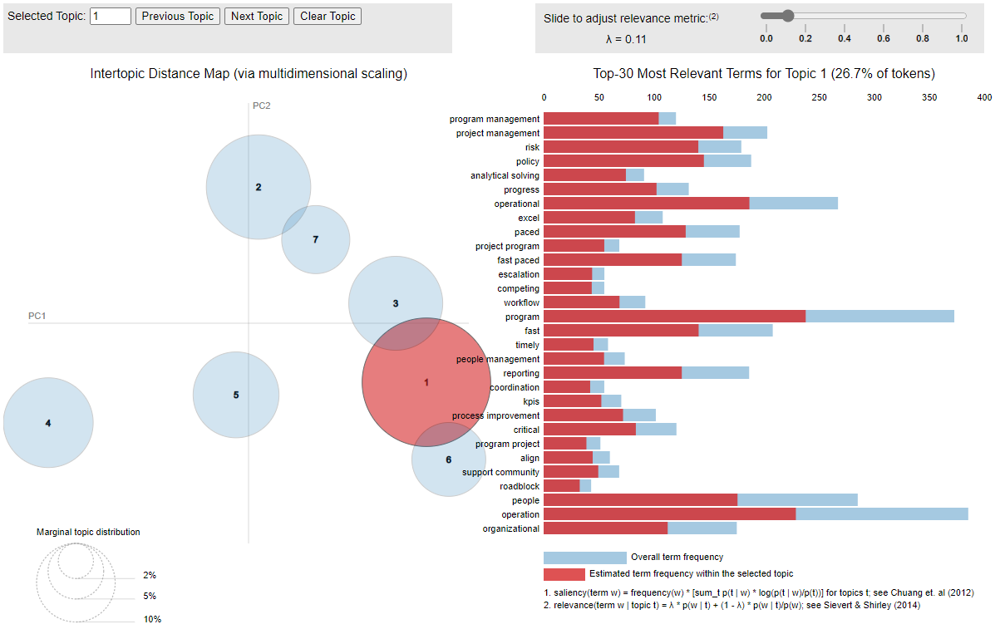

- This topic includes words such as operations, process improvement, people management, project management, product management. Hence, this topic belongs to Global Operations.

#### Topic 2
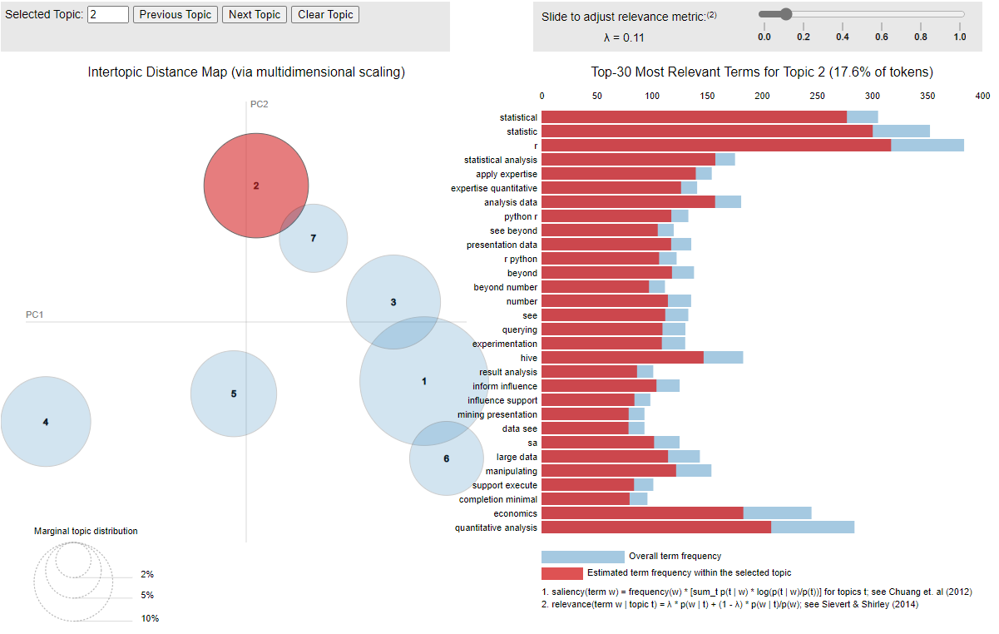

- This topic includes skills such as statistics, R, Statistical analysis, Data analysis, python. Based on these keywords, we can say that this topic belongs to data and analytics job category.

#### Topic 3
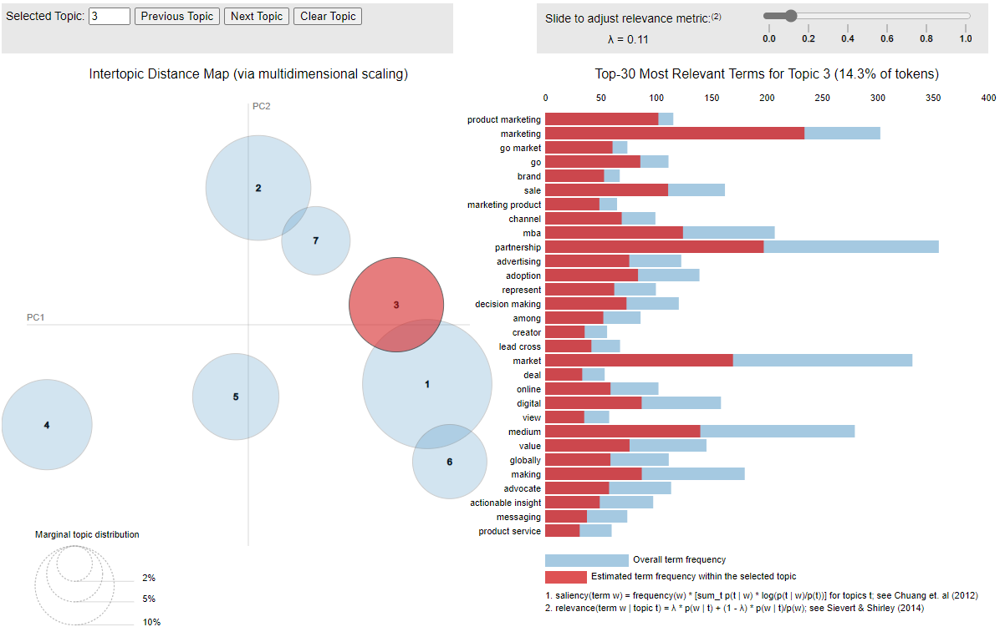

- This topic has words such as product marketing, sale, product service, mba, brand. Hence, this topic belongs to product management.

#### Topic 4
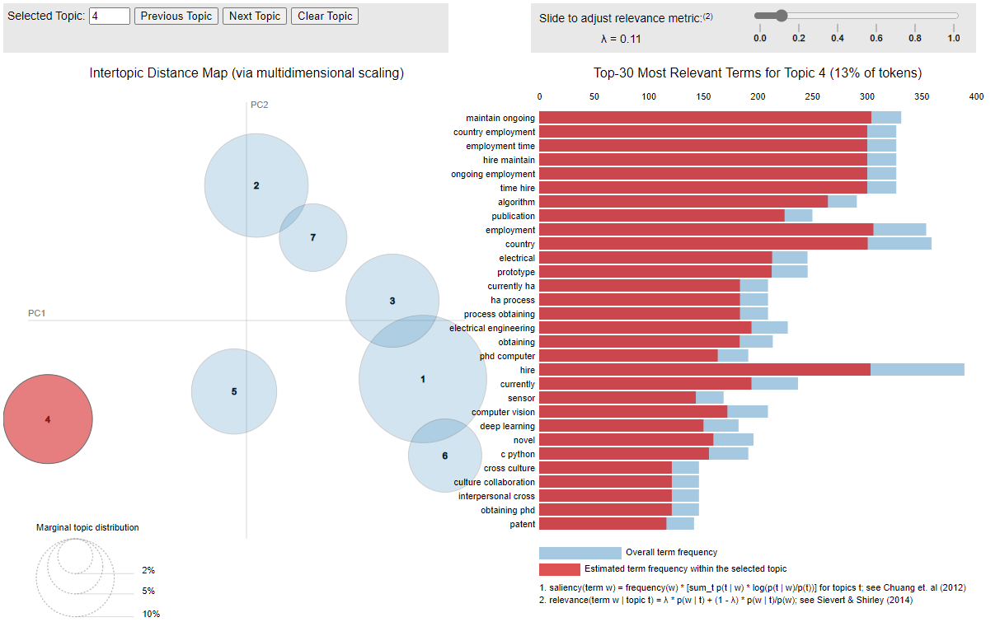

- This topic includes words such as PhD, computer vision, deep learning, patent, pytorch, novel. Hence, this topic belongs to research scientist.

#### Topic 5
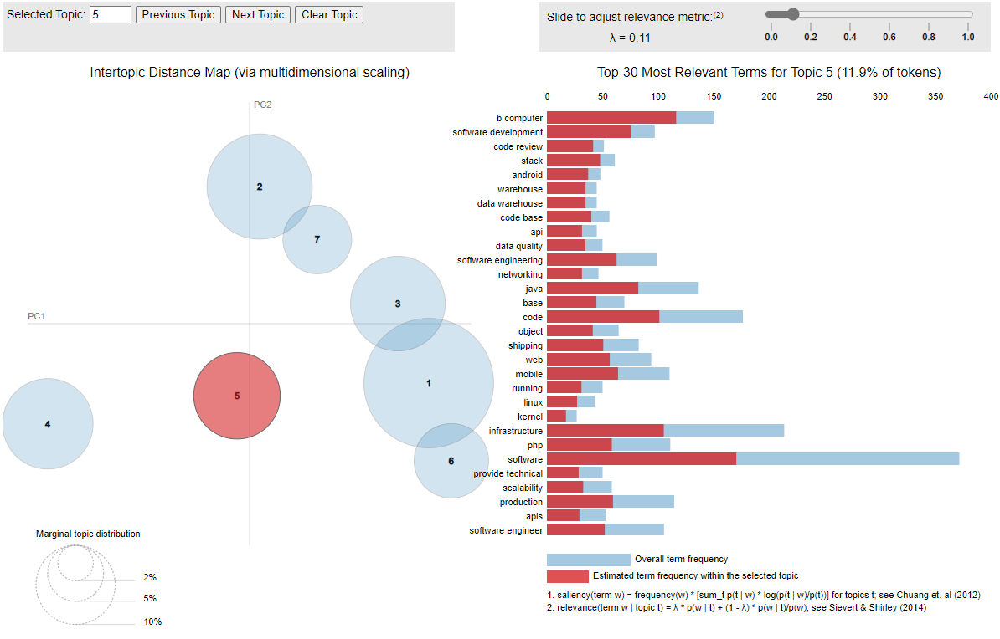

- This topic has words such as software development, android, stack, object, php, data warehouse, web. Hence, this topic belongs to software development.

#### Topic 6
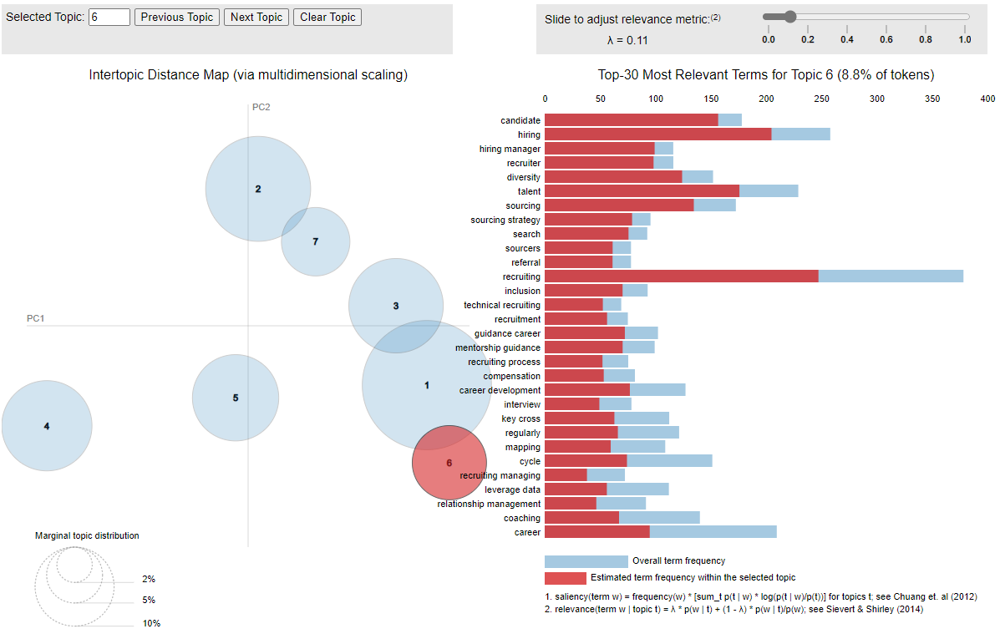

- This topic includes words such as recruiting, hiring, candidate, interview, career. Hence this topic belongs to people & recruiting.

#### Topic 7
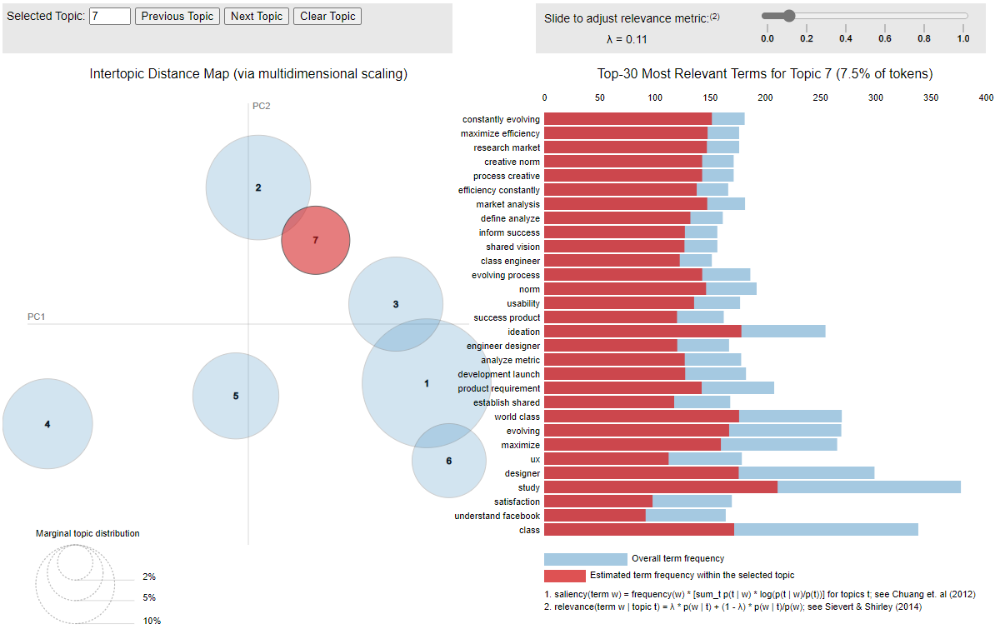

- This topic has words such as market analysis, success product, research market, product requirement. I think this topic belongs to Business Development & Partnerships, but we cal also see it is very close to topic 3 in the two principle co-ordinates. Domain experts can make better judgement here as to which topic belongs to the actual job category.

- We can also observe by howering over the words in the right side horizontal bar plot. E.g. in the below image, you can see when we hover over computer science, the size of the bubbles in the left plot changes. This means that computer science is very relevant to topic 5, then to topic 4 and last to topic 2. Having a domain knowledge of this field, we can also observe that this makes sense. For software developer, knowledge of computer science is a must. It's also applicable to research scientists at Facebook and to data and analytics professionals. We can see that for topic 1 and topic 6, this word is not that relevant as these topics inlcude people & recruiting and global operations.
<img src='.\comp_science.png'>

- Using the above results, one can analyze the skill requirements for different job categories as well as relate how the skills are relevant to each other.

## 9. Analysis Summary and Conclusion

### 9.1. Algorithm Comparison Summary

#### 9.1.1. Comparing Algorithm Performance

In [124]:
results_dictionary = {'HAC with complete linkage': [0.0427, 0.27, 0.43, 0.45], 'LDA': [0.0285, 0.26, 0.31, 0.39]}
results_df = pd.DataFrame(results_dictionary)
results_df.index = ['Average Silhouette Score', 'RAND index', 'Homogeneity score', 'Completeness score']

In [125]:
results_df

,HAC with complete linkage,LDA
Average Silhouette Score,0.0427,0.0285
RAND index,0.2700,0.2600
Homogeneity score,0.4300,0.3100
Completeness score,0.4500,0.3900


- Performance of HAC with complete linkage is slightly better compared to LDA.

#### 9.1.2. Comparing Algorithm Results

* **HAC with complete linkage algorithm**

The dictionary below is created to see what are job categories in each cluster and what is the number of job postings for each category

In [71]:
categories_per_cluster = {}
for i in range(8):
    count_dictionary = {}
    for value in df.category[df["predicted_cluster"]==i].unique():
        count_dictionary[value] = len(df.category[df["predicted_cluster"]==i][df["category"] == value])
    categories_per_cluster[i] = count_dictionary
categories_per_cluster

{0: {'Data and Analytics': 3,
  'Software Engineering': 11,
  'Research Scientist': 5,
  'Business Development & Partnerships': 2,
  'Global Operations': 1},
 1: {'Product Management': 16,
  'Data and Analytics': 19,
  'Business Development & Partnerships': 47,
  'Software Engineering': 3,
  'People & Recruiting': 69,
  'Research Scientist': 12,
  'Global Operations': 77},
 2: {'Product Management': 42,
  'Data and Analytics': 3,
  'Business Development & Partnerships': 12,
  'Software Engineering': 32,
  'Research Scientist': 1,
  'Global Operations': 5},
 3: {'Research Scientist': 62,
  'Data and Analytics': 1,
  'Software Engineering': 28},
 4: {'Product Management': 3,
  'Software Engineering': 33,
  'Research Scientist': 23},
 5: {'Data and Analytics': 98,
  'Software Engineering': 4,
  'Research Scientist': 9,
  'People & Recruiting': 6,
  'Global Operations': 12,
  'Business Development & Partnerships': 2},
 6: {'Research Scientist': 33, 'Business Development & Partnerships': 1}

* Word cloud for our clusters from HAC complete linkage

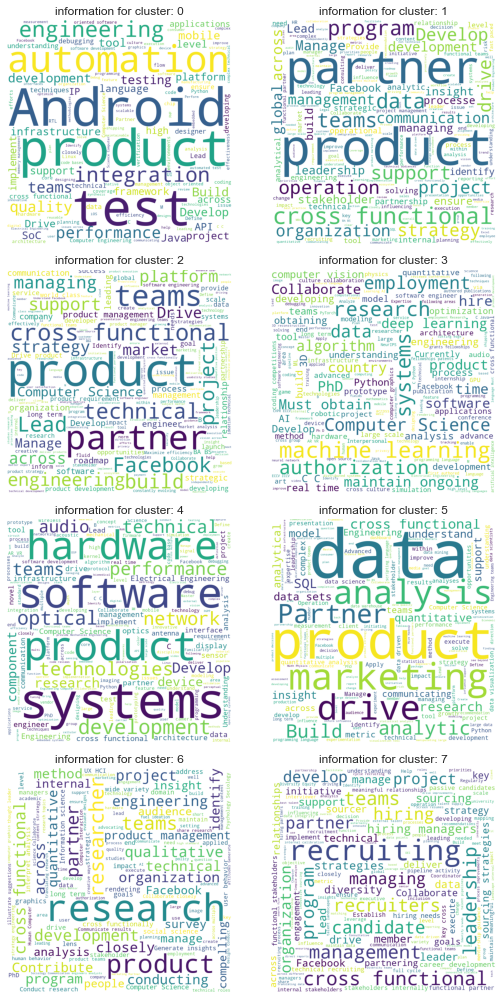

In [72]:
num_row = 4
num_col = 2

# get a segment of the dataset
num = num_row*num_col

# plot images
fig, axes = plt.subplots(num_row, num_col, figsize=(4*num_col,3.5*num_row))

for i in range(num_row* num_col):
    try:
        wordcloud = plot_wordcloud(df.information[df.predicted_cluster==i])
        ax = axes[i//num_col, i%num_col]
        ax.imshow(wordcloud)
        ax.axis("off")
        ax.set_title(f'information for cluster: {i}')
    except:
        pass

plt.tight_layout()
plt.show()

* **Latent Dirichlet algorithm**

The dictionary below is created to see what are job categories in each cluster and what is the number of job postings for each category

In [131]:
reverse_category_mapping = {4:'Product Management', 3:'Research Scientist', 0:'Data and Analytics',
       6:'Business Development & Partnerships', 1:'Software Engineering',
       5:'People & Recruiting', 2:'Global Operations'}

In [149]:
pred_df = pd.DataFrame(pred, columns=['pred'])
labeled_pred = pred_df['pred'].map(reverse_category_mapping)
pred_df['labeled_pred'] = labeled_pred

In [153]:
categories_per_cluster = {}
for i in range(7):
    count_dictionary = {}
    for value in df.category[pred_df.pred==i].unique():
        count_dictionary[value] = len(df.category[pred_df.pred==i][df["category"] == value])
    categories_per_cluster[i] = count_dictionary
categories_per_cluster

{0: {'Product Management': 2,
  'Data and Analytics': 101,
  'Research Scientist': 40,
  'Software Engineering': 10,
  'People & Recruiting': 25,
  'Global Operations': 42,
  'Business Development & Partnerships': 6},
 1: {'Product Management': 14,
  'Software Engineering': 88,
  'Business Development & Partnerships': 8,
  'Data and Analytics': 17,
  'Research Scientist': 20,
  'People & Recruiting': 4,
  'Global Operations': 7},
 2: {'Product Management': 16,
  'Data and Analytics': 5,
  'Business Development & Partnerships': 48,
  'Global Operations': 21,
  'Research Scientist': 14,
  'People & Recruiting': 20},
 3: {'Product Management': 1,
  'Software Engineering': 13,
  'Research Scientist': 60,
  'Global Operations': 1},
 4: {'Product Management': 28,
  'Data and Analytics': 1,
  'Research Scientist': 9,
  'People & Recruiting': 2},
 5: {'People & Recruiting': 66, 'Global Operations': 4},
 6: {'Research Scientist': 2,
  'Global Operations': 20,
  'People & Recruiting': 10,
  'Bus

> The algorithm performed very well on separating people & recruiting, research scientist, and product mangement. For other categories too, it did pretty good.

* Interactive LDA Visualization

In [154]:
IFrame(src='./results/ldavis_tuned_7final.html', width=700, height=600)

### 9.2. Conclusion and Insights Summary

#### <u>Conclusion for HAC complete linkage:</u>

* Answering our research questions we can do the following conclusion for HAC complete linkage clustering algorithm. Based on the analysis in 7.6, we can say that many of the job postings from Business Development & Partnerships, People & Recruiting and Global Operations job categories are very similar to each other and it may be easier to switch between these roles. A lot of the job postings are very similar between Software Engineering and Research Scientist roles. These job postings have sub-categories which are probably better described by the following roles: Machine Learning Engineer, Mobile Application Developer and Software Developer. We might also claim that it will be easier to switch jobs between Software Engineering and Research Scientist roles. Data and Analytics is pretty much different from the other categories, but we can say that it could be somewhat possible to switch to Global Operations roles. There is a sub-category of People & Recruiting job category which is very different from all other job postings and the same is for some Research Scientist positions, so it will be hard to switch the job category for the people working at these jobs. Product Management job postings use very similar description as some Software Engineering positions and these Software Engineering positions are probably a manager role job openings, as they require less tech skills and more managerial skills, that is why it might be possible to switch between these job categories from/to Software Engineering managerial position.

#### <u>Conclusion for Latent Dirichlet Algorithm:</u>

* The answer to the research questions through LDA also significantly matches with the HAC with complete linkage conclusion.

#### Research Question 1: What are the top skills required for different job categories?
* A user can click on a particular bubble in the bubble plot and the top skills mentioned in that topic will be shown. This way, we answer the question on top skills required for each job category.
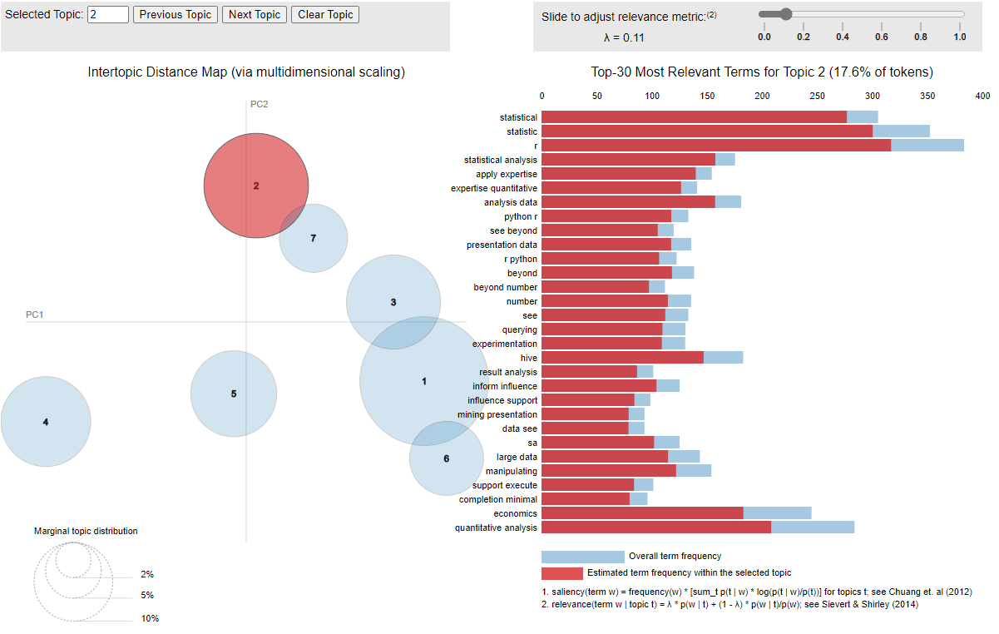

#### Research Question 2: How different job categories are related to each other and what are the shared skills?
* in the below plot, we can see when we hover over computer science, the size of the bubbles in the left plot changes. This means that computer science is very relevant to topic 5, then to topic 4 and last to topic 2. Having a domain knowledge of this field, we can also observe that this makes sense. For software developer, knowledge of computer science is a must. It's also applicable to research scientists at Facebook and to data and analytics professionals. We can see that for topic 1 and topic 6, this word is not that relevant as these topics inlcude people & recruiting and global operations.
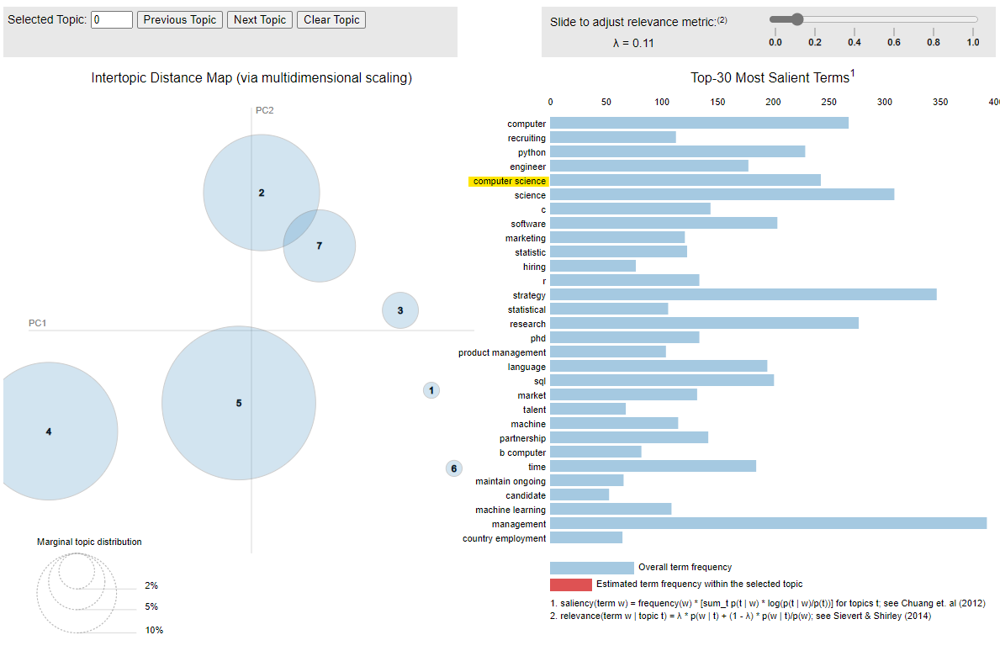

#### Research Question 3: If someone wants to switch to a different career journey, which one would be easier to switch?
* This can also be answered based on the above plot in research question 1. We can see that topic 3, 1 and 6 are closer to each other. These are the topics that require people management skills. And with good people management skills, switching between these roles will be easy.

* Also, topic 4 is research scientist. We can see its very much different that above mentioned topics. Hence, it will be hard to switch to this role from above roles. However, software engineering topic (5) is much closer than topics 3, 1 and 6. This means, at Facebook, its easy for software engineer to swtich to research scientist and vice-versa.

## 10. Group Contribution Report

### Nursultan Baitlessov
* Data cleaning and vectorization
* Exploratory Data Analysis
* HAC complete linkage Algorithm

### Sandip Sonawane
* Dataset Selection
* Data cleaning and vectorization
* Exploratory Data Analysis
* Latent Dirichlet Algorithm